# Analyze AFM tip solvation

This notebook demonstrates deposition of an SDS adsorption layer on a non-spherical AFM tip model.

## Initialization

### IPython magic

In [1]:
%load_ext autoreload
%autoreload 2

In [4]:
%aimport

Modules to reload:
all-except-skipped

Modules to skip:



### Imports

In [2]:
import ase.io # here used for reading pdb files
from ase.visualize import view
from ase.visualize.plot import plot_atoms # has nasty offset issues
from cycler import cycler # here used for cycling through colors in plots
import datetime
import fabric # for pythonic ssh connections
from fireworks import LaunchPad, Firework, Tracker, Workflow 
from fireworks import FileTransferTask, PyTask, ScriptTask

# FireWorks functionality 
from fireworks import Firework, LaunchPad, ScriptTask, Workflow
from fireworks.user_objects.firetasks.templatewriter_task import TemplateWriterTask
from fireworks.user_objects.firetasks.filepad_tasks import AddFilesTask, GetFilesTask, GetFilesByQueryTask
from imteksimfw.fireworks.user_objects.firetasks.cmd_tasks import CmdTask
from fireworks.utilities.filepad import FilePad # direct FilePad access, similar to the familiar LaunchPad

import glob
import gc # manually clean up memory with gc.collect()
import gromacs # GromacsWrapper, here used for evoking gmc commands, reading and writing .ndx files
# from io import StringIO, TextIOWrapper
import io
from IPython.display import display, Image #, Video # display image files within notebook
from ipywidgets import Video  # display video within notebook
import itertools # for products of iterables
import json # generic serialization of lists and dicts
import jinja2 # here used for filling packmol input script template
import jinja2.meta # for gathering variables in a jinja2 template
import logging 
import matplotlib.pyplot as plt
import MDAnalysis as mda # here used for reading and analyzing gromacs trajectories
import MDAnalysis.analysis.rdf as mda_rdf
import MDAnalysis.analysis.rms as mda_rms
from mpl_toolkits.mplot3d import Axes3D # here used for 3d point cloud scatter plot
import miniball # finds minimum bounding sphere of a point set
import nglview
import numpy as np
import os, os.path
import pandas as pd
import panedr # reads GROMACS edr into pandas df, requires pandas and pbr
import parmed as pmd # has quite a few advantages over ASE when it comes to parsing pdb
from pprint import pprint
import pymongo # for sorting in queries
import scipy.constants as sc
import subprocess # used for evoking external packmol
import sys
import tempfile
import yaml

NOTE: Some configuration directories are not set up yet: 
	/home/centos/.gromacswrapper
	/home/centos/.gromacswrapper/qscripts
	/home/centos/.gromacswrapper/templates
NOTE: You can create the configuration file and directories with:
	>>> import gromacs
	>>> gromacs.config.setup()


GromacsWrapper might need a file `~/.gromacswrapper.cfg` with content
```cfg
[Gromacs]
tools = gmx gmx_d 
# gmx_mpi_d gmx_mpi_d

# name of the logfile that is written to the current directory
logfilename = gromacs.log

# loglevels (see Python's logging module for details)
#   ERROR   only fatal errors
#   WARN    only warnings
#   INFO    interesting messages
#   DEBUG   everything

# console messages written to screen
loglevel_console = INFO

# file messages written to logfilename
loglevel_file = DEBUG
```
in order to know the GROMACS executables it is allowed to use. Otherwise,
calls to `gmx_mpi` or `gmx_mpi_d` without MPI wrapper might lead to MPI 
warnings in output that cause GromacsWrapper to fail.

### Logging

In [3]:
logging.basicConfig(level=logging.INFO)
logger = logging.getLogger()
logger.setLevel(logging.INFO)

ParmEd needs to know the GROMACS topology folder, usually get this from 
envionment variable `GMXLIB`:

### Function definitions

In [4]:
def find_undeclared_variables(infile):
    """identify all variables evaluated in a jinja 2 template file"""
    env = jinja2.Environment()
    with open(infile) as template_file:
        parsed = env.parse(template_file.read())

    undefined = jinja2.meta.find_undeclared_variables(parsed)
    return undefined

In [5]:
def memuse():
    """Quick overview on memory usage of objects in Jupyter notebook"""
    # https://stackoverflow.com/questions/40993626/list-memory-usage-in-ipython-and-jupyter
    # These are the usual ipython objects, including this one you are creating
    ipython_vars = ['In', 'Out', 'exit', 'quit', 'get_ipython', 'ipython_vars']

    # Get a sorted list of the objects and their sizes
    return sorted([(x, sys.getsizeof(globals().get(x))) for x in dir(sys.modules['__main__']) if not x.startswith('_') and x not in sys.modules and x not in ipython_vars], key=lambda x: x[1], reverse=True)

### Global settings

In [44]:
# pandas settings
pd.options.display.max_rows = 200
pd.options.display.max_columns = 16
pd.options.display.max_colwidth = 256

In [6]:
os.environ['GMXLIB'] = '/gmx_top'

In [7]:
# pmd.gromacs.GROMACS_TOPDIR = os.environ['GMXLIB']
pmd.gromacs.GROMACS_TOPDIR = '/gmx_top'

In [8]:
# prefix = '/mnt/dat/work/testuser/indenter/sandbox/20191110_packmol'
prefix = '/mnt/dat/work'

In [9]:
work_prefix = '/mnt/dat/work/tmp'

In [10]:
try:
    os.mkdir(work_prefix)
except FileExistsError as exc:
    print(exc)

[Errno 17] File exists: '/mnt/dat/work/tmp'


In [11]:
os.chdir(work_prefix)

In [12]:
# the FireWorks LaunchPad
lp = LaunchPad.auto_load() #Define the server and database
# FilePad behaves analogous to LaunchPad
fp = FilePad.auto_load()

## Conversion from LAMMPS data format to PDB

The vollowing bash / tcl snippet converts a LAMMPS data file to PDB, assigning the desired names as mapped in a yaml file
```bash
#!/bin/bash
# echo "package require jlhvmd; jlh lmp2pdb indenter.lammps indenter.pdb" | vmd -eofexit
vmd -eofexit << 'EOF'
package require jlhvmd
topo readlammpsdata indenter.lammps
jlh type2name SDS_type2name.yaml
jlh name2res  SDS_name2res.yaml
set sel [atomselect top all]
$sel writepdb indenter.pdb
EOF

pdb_chain.py indenter.pdb > indenter_wo_chainid.pdb
pdb_reres_by_atom_9999.py indenter_wo_chainid.pdb > indenter_reres.pdb
```

Requires

* VMD (tested with 1.9.3) with topotools
* jlhvmd VMD plugin: https://github.com/jotelha/jlhvmd
* pdb-tools: https://github.com/haddocking/pdb-tools/

## Overview

### Overview on projects in database

In [16]:
query = {'metadata.datetime': {'$gt': '2020'} }

In [17]:
fp.filepad.count_documents(query)

3075

In [18]:
aggregation_pipeline = [
    {
        "$match": query
    },
    {  # group by unique project id
        "$group": { 
            "_id": { 'project': '$metadata.project' },
            "object_count": {"$sum": 1}, # count matching data sets
            "earliest":  {'$min': '$metadata.datetime' },
            "latest":  {'$max': '$metadata.datetime' },
        },
    },
    {  # pull 'project' field up in hierarchy
        "$addFields": { 
            "project": "$_id.project",
        },
    },
    {  # drop nested '_id.project'
        "$project": { 
            "_id": False 
        },
    },
    {  # sort by earliest date, descending
        "$sort": { 
            "earliest": pymongo.DESCENDING,
        }
    }
]

# sort_aggregation
#aggregation_pipeline = [ match_aggregation, group_aggregation, set_aggregation ]
cursor = fp.filepad.aggregate(aggregation_pipeline)

res = [c for c in cursor]
res_df = pd.DataFrame(data=res) # pandas Dataframe is just nice for printing in notebook

In [19]:
res_df

,object_count,earliest,latest,project
0,1386,2020-07-09 01:30:15.276530,2020-07-09 01:30:16.819138,2020-07-09-passivation
1,350,2020-07-08 13:31:27.106684,2020-07-08 14:02:41.994152,2020-07-08-passiv-trial-revisited
2,236,2020-07-02 19:37:19.035754,2020-07-02 19:37:19.770123,2020-07-03-passiv-trial-revisited
3,54,2020-07-02 03:49:00.103034,2020-07-02 03:49:00.325450,2020-07-01-passiv-trial-revisited
4,6,2020-05-11 15:34:17.973141,2020-05-11 15:34:18.054752,2020-05-11-2nd-passiv-trial
5,64,2020-05-11 00:46:35.427907,2020-05-11 00:46:35.637375,2020-05-11-passiv-trial
6,76,2020-05-09 23:23:58.405636,2020-05-09 23:23:58.629348,2020-05-10-passiv-trial
7,54,2020-05-09 18:06:29.244729,2020-05-09 18:06:29.470488,2020-05-09-parametric
8,276,2020-05-08 17:40:43.151560,2020-05-08 20:09:19.785964,2020-05-08-final
9,8,2020-05-08 16:46:54.125267,2020-05-08 16:46:55.061579,2020-05-08-dtool-trial


### Overview on steps in project

In [13]:
project_id = '2020-07-09-passivation'

In [14]:
# queries to the data base are simple dictionaries
query = {
    'metadata.project': project_id,
}

In [15]:
# use underlying MongoDB functionality to check total number of documents matching query
fp.filepad.count_documents(query)

1398

In [16]:
# check files degenerate by 'metadata.type' ad 'metadata.name'
aggregation_pipeline = [
    {
        "$match": query
    },
    {  # group by unique project id
        "$group": { 
            "_id": { 
                'step': '$metadata.step',
            },
            "object_count": {"$sum": 1}, # count matching data sets
            "earliest":  {'$min': '$metadata.datetime' },
            "latest":  {'$max': '$metadata.datetime' },
        },
    },
    {  # sort by earliest date, descending
        "$sort": { 
            "earliest": pymongo.DESCENDING,
        }
    }
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

res = [ {**c['_id'], **c} for c in cursor]
columns = ['step', 'earliest', 'latest', 'object_count', '_id']
res_df = pd.DataFrame(data=res, columns=columns) # pandas Dataframe is just nice for printing in notebook
del res_df["_id"]

In [17]:
res_df

,step,earliest,latest,object_count
0,ParametricBranching:GromacsNPTEquilibration:Pr...,2020-07-09 01:30:15.580991,2020-07-09 01:30:16.819138,252
1,ParametricBranching:GromacsNVTEquilibration:Pr...,2020-07-09 01:30:15.549133,2020-07-09 01:30:16.808797,252
2,ParametricBranching:GromacsEnergyMinimizationA...,2020-07-09 01:30:15.524515,2020-07-09 01:30:16.798142,240
3,ParametricBranching: GromacsSolvate:ProcessAna...,2020-07-09 01:30:15.516945,2020-07-09 01:30:16.790365,24
4,ParametricBranching:GromacsPull:ProcessAnalyze...,2020-07-09 01:30:15.514319,2020-07-09 01:30:16.787594,276
5,ParametricBranching:GromacsPullPrep:ProcessAna...,2020-07-09 01:30:15.496033,2020-07-09 01:30:16.779845,48
6,ParametricBranching:GromacsEnergyMinimization:...,2020-07-09 01:30:15.493208,2020-07-09 01:30:16.776401,228
7,ParametricBranching:GromacsPrep:ProcessAnalyze...,2020-07-09 01:30:15.485505,2020-07-09 01:30:16.768394,36
8,ParametricBranching:SphericalSurfactantPacking...,2020-07-09 01:30:15.477057,2020-07-09 01:30:16.759762,24
9,PackingConstraintSpheres:ProcessAnalyzeAndVisu...,2020-07-09 01:30:15.359415,2020-07-09 01:30:15.359422,2


In [37]:
res_df['step'].values

array(['ParametricBranching:GromacsNPTEquilibration:ProcessAnalyzeAndVisualize:push_filepad',
       'ParametricBranching:GromacsNVTEquilibration:ProcessAnalyzeAndVisualize:push_filepad',
       'ParametricBranching:GromacsEnergyMinimizationAfterSolvation:ProcessAnalyzeAndVisualize:push_filepad',
       'ParametricBranching: GromacsSolvate:ProcessAnalyzeAndVisualize:push_filepad',
       'ParametricBranching:GromacsPull:ProcessAnalyzeAndVisualize:push_filepad',
       'ParametricBranching:GromacsPullPrep:ProcessAnalyzeAndVisualize:push_filepad',
       'ParametricBranching:GromacsEnergyMinimization:ProcessAnalyzeAndVisualize:push_filepad',
       'ParametricBranching:GromacsPrep:ProcessAnalyzeAndVisualize:push_filepad',
       'ParametricBranching:SphericalSurfactantPacking:ProcessAnalyzeAndVisualize:push_filepad',
       'PackingConstraintSpheres:ProcessAnalyzeAndVisualize:push_filepad',
       'SurfactantMoleculeMeasures:ProcessAnalyzeAndVisualize:push_filepad',
       'IndenterBound

### Overview on objects in project

In [38]:
project_id = '2020-07-09-passivation'

In [39]:
# queries to the data base are simple dictionaries
query = {
    'metadata.project': project_id,
}

In [40]:
# use underlying MongoDB functionality to check total number of documents matching query
fp.filepad.count_documents(query)

1398

In [41]:
# check files degenerate by 'metadata.type' ad 'metadata.name'
aggregation_pipeline = [
    {
        "$match": query
    },
    {  # group by unique project id
        "$group": { 
            "_id": { 
                'type': '$metadata.type',
                'name': '$metadata.name',
                'step': '$metadata.step',
            },
            "object_count": {"$sum": 1}, # count matching data sets
            "earliest":  {'$min': '$metadata.datetime' },
            "latest":  {'$max': '$metadata.datetime' },
        },
    },
    {  # sort by earliest date, descending
        "$sort": { 
            "earliest": pymongo.DESCENDING,
        }
    }
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

res = [ {**c['_id'], **c} for c in cursor]
columns = ['type', 'step', 'name', 'earliest', 'latest', 'object_count', '_id']
res_df = pd.DataFrame(data=res, columns=columns) # pandas Dataframe is just nice for printing in notebook
del res_df["_id"]

In [45]:
res_df

,type,step,name,earliest,latest,object_count
0,mp4_file,ParametricBranching:GromacsNPTEquilibration:ProcessAnalyzeAndVisualize:push_filepad,NaN,2020-07-09 01:30:15.581056,2020-07-09 01:30:16.819138,12
1,surfactant_tail_rmsd,ParametricBranching:GromacsNPTEquilibration:ProcessAnalyzeAndVisualize:push_filepad,NaN,2020-07-09 01:30:15.581053,2020-07-09 01:30:16.819135,12
2,surfactant_head_rmsd,ParametricBranching:GromacsNPTEquilibration:ProcessAnalyzeAndVisualize:push_filepad,NaN,2020-07-09 01:30:15.581050,2020-07-09 01:30:16.819133,12
3,substrate_rmsd,ParametricBranching:GromacsNPTEquilibration:ProcessAnalyzeAndVisualize:push_filepad,NaN,2020-07-09 01:30:15.581047,2020-07-09 01:30:16.819130,12
4,counterion_rmsd,ParametricBranching:GromacsNPTEquilibration:ProcessAnalyzeAndVisualize:push_filepad,NaN,2020-07-09 01:30:15.581043,2020-07-09 01:30:16.819127,12
5,surfactant_tail_surfactant_tail_rdf,ParametricBranching:GromacsNPTEquilibration:ProcessAnalyzeAndVisualize:push_filepad,NaN,2020-07-09 01:30:15.581040,2020-07-09 01:30:16.819124,12
6,surfactant_head_surfactant_tail_rdf,ParametricBranching:GromacsNPTEquilibration:ProcessAnalyzeAndVisualize:push_filepad,NaN,2020-07-09 01:30:15.581037,2020-07-09 01:30:16.819122,12
7,surfactant_head_surfactant_head_rdf,ParametricBranching:GromacsNPTEquilibration:ProcessAnalyzeAndVisualize:push_filepad,NaN,2020-07-09 01:30:15.581034,2020-07-09 01:30:16.819119,12
8,substrate_surfactant_tail_rdf,ParametricBranching:GromacsNPTEquilibration:ProcessAnalyzeAndVisualize:push_filepad,NaN,2020-07-09 01:30:15.581031,2020-07-09 01:30:16.819117,12
9,substrate_surfactant_head_rdf,ParametricBranching:GromacsNPTEquilibration:ProcessAnalyzeAndVisualize:push_filepad,NaN,2020-07-09 01:30:15.581028,2020-07-09 01:30:16.819114,12


### Overview on images by distinct steps

In [46]:
query = {
    'metadata.project': project_id,
    'metadata.type': 'png_file',
}

In [47]:
# use underlying MongoDB functionality to check total number of documents matching query
fp.filepad.count_documents(query)

15

In [48]:
# check files degenerate by 'metadata.type' ad 'metadata.name'

aggregation_pipeline = [
    {
        "$match": query
    },
    {  # group by unique project id
        "$group": { 
            "_id": { 
                'type': '$metadata.type',
                'name': '$metadata.name',
                'step': '$metadata.step',
            },
            "object_count": {"$sum": 1}, # count matching data sets
            "earliest":  {'$min': '$metadata.datetime' },
            "latest":  {'$max': '$metadata.datetime' },
        },
    },
    {  # sort by earliest date, descending
        "$sort": { 
            "earliest": pymongo.DESCENDING,
        }
    }
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

res = [ {**c['_id'], **c} for c in cursor]
columns = ['step', 'type', 'name', 'earliest', 'latest', 'object_count', '_id']
res_df = pd.DataFrame(data=res, columns=columns) # pandas Dataframe is just nice for printing in notebook
del res_df["_id"]

In [49]:
res_df

,step,type,name,earliest,latest,object_count
0,ParametricBranching:SphericalSurfactantPacking:ProcessAnalyzeAndVisualize:push_filepad,png_file,NaN,2020-07-09 01:30:15.477063,2020-07-09 01:30:16.759762,12
1,PackingConstraintSpheres:ProcessAnalyzeAndVisualize:push_filepad,png_file,NaN,2020-07-09 01:30:15.359422,2020-07-09 01:30:15.359422,1
2,SurfactantMoleculeMeasures:ProcessAnalyzeAndVisualize:push_filepad,png_file,NaN,2020-07-09 01:30:15.326057,2020-07-09 01:30:15.326057,1
3,IndenterBoundingSphere:ProcessAnalyzeAndVisualize:push_filepad,png_file,NaN,2020-07-09 01:30:15.276541,2020-07-09 01:30:15.276541,1


In [50]:
res_df["step"][0]

'ParametricBranching:SphericalSurfactantPacking:ProcessAnalyzeAndVisualize:push_filepad'

## Packing visualization

### Indenter bounding sphere

In [51]:
query = {
    'metadata.project': project_id,
    'metadata.type': 'png_file',
    'metadata.step': {'$regex': 'IndenterBoundingSphere'}
}

In [52]:
# use underlying MongoDB functionality to check total number of documents matching query
fp.filepad.count_documents(query)

1

In [53]:
# check files degenerate by 'metadata.type' ad 'metadata.name'

aggregation_pipeline = [
    {
        "$match": query
    },
    {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    },
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

obj_list = []
for i, c in enumerate(cursor): 
    content, metadata = fp.get_file_by_id(c["gfs_id"])
    with tempfile.NamedTemporaryFile(suffix='.png') as tmp:
        tmp.write(content)
        obj_list.append(Image(filename=tmp.name)) 
    print('.',end='')

.

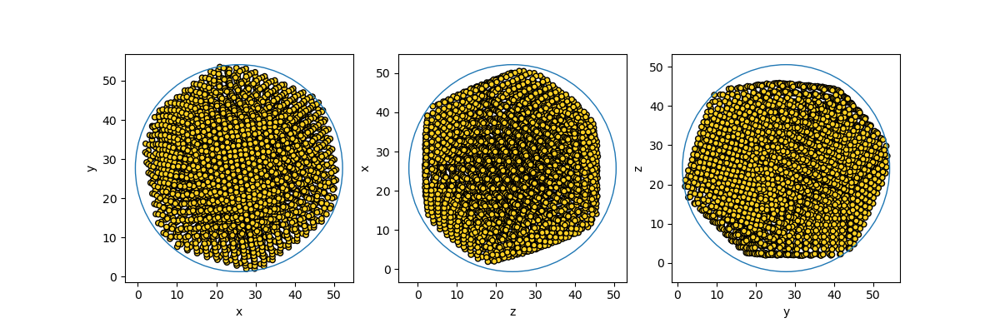

In [54]:
for obj in obj_list:
    display(obj)

### Surfactant measures

In [55]:
query = {
    'metadata.project': project_id,
    'metadata.type': 'png_file',
    'metadata.step': {'$regex': 'SurfactantMoleculeMeasures'}
}

In [56]:
# use underlying MongoDB functionality to check total number of documents matching query
fp.filepad.count_documents(query)

1

In [57]:
# check files degenerate by 'metadata.type' ad 'metadata.name'

aggregation_pipeline = [
    {
        "$match": query
    },
    {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    },
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

obj_list = []
for i, c in enumerate(cursor): 
    content, metadata = fp.get_file_by_id(c["gfs_id"])
    with tempfile.NamedTemporaryFile(suffix='.png') as tmp:
        tmp.write(content)
        obj_list.append(Image(filename=tmp.name)) 
    print('.',end='')

.

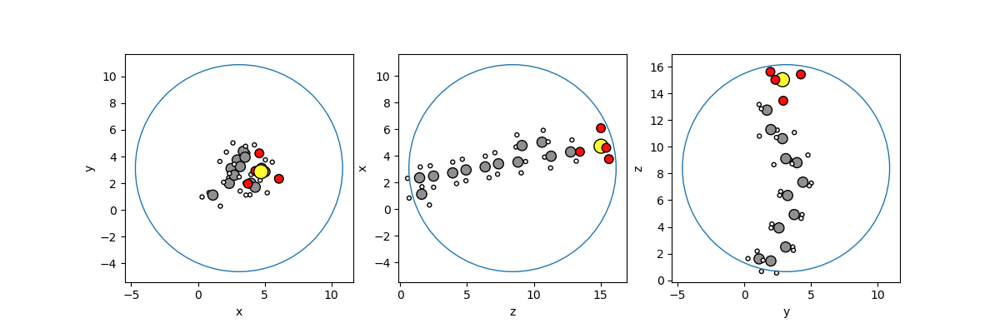

In [58]:
obj_list[0]

### Packing constraints

In [59]:
query = {
    'metadata.project': project_id,
    'metadata.type': 'png_file',
    'metadata.step': {'$regex': 'PackingConstraintSpheres'}
}

In [60]:
# use underlying MongoDB functionality to check total number of documents matching query
fp.filepad.count_documents(query)

1

In [61]:
# check files degenerate by 'metadata.type' ad 'metadata.name'

aggregation_pipeline = [
    {
        "$match": query
    },
    {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    },
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

obj_list = []
for i, c in enumerate(cursor): 
    content, metadata = fp.get_file_by_id(c["gfs_id"])
    with tempfile.NamedTemporaryFile(suffix='.png') as tmp:
        tmp.write(content)
        obj_list.append(Image(filename=tmp.name)) 
    print('.',end='')

.

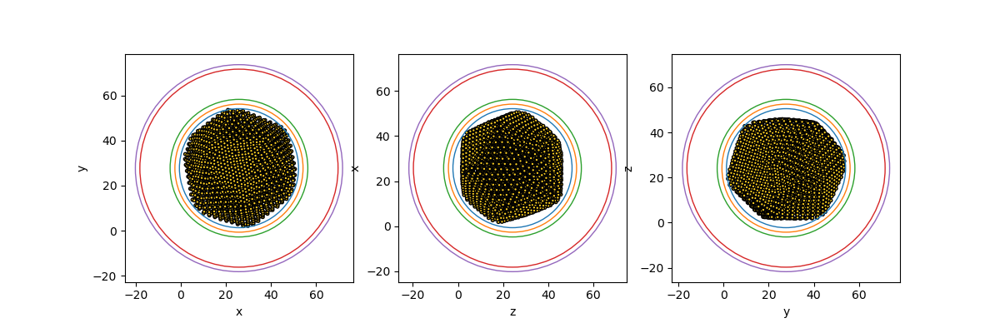

In [62]:
obj_list[0]

### Packed film

In [63]:
query = {
    'metadata.project': project_id,
    'metadata.type': 'png_file',
    'metadata.step': {'$regex': 'SphericalSurfactantPacking'}
}

In [64]:
# use underlying MongoDB functionality to check total number of documents matching query
fp.filepad.count_documents(query)

12

In [65]:
# check files degenerate by 'metadata.type' ad 'metadata.name'

aggregation_pipeline = [
    {
        "$match": query
    },
    {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    },
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

obj_list = []
for i, c in enumerate(cursor): 
    content, metadata = fp.get_file_by_id(c["gfs_id"])
    with tempfile.NamedTemporaryFile(suffix='.png') as tmp:
        tmp.write(content)
        obj_list.append(Image(filename=tmp.name)) 
    print('.',end='')

............

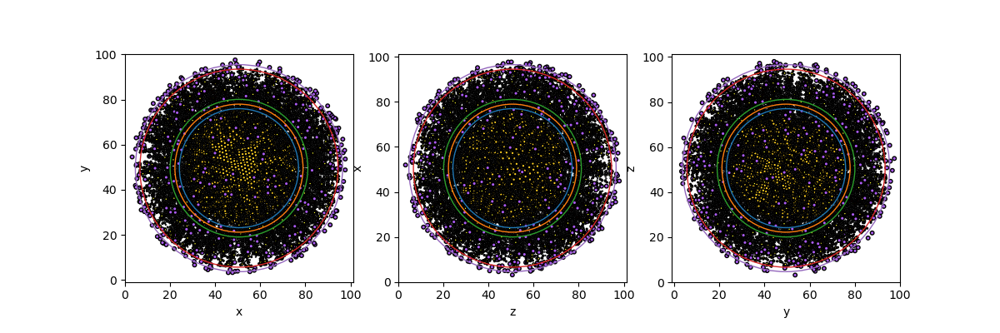

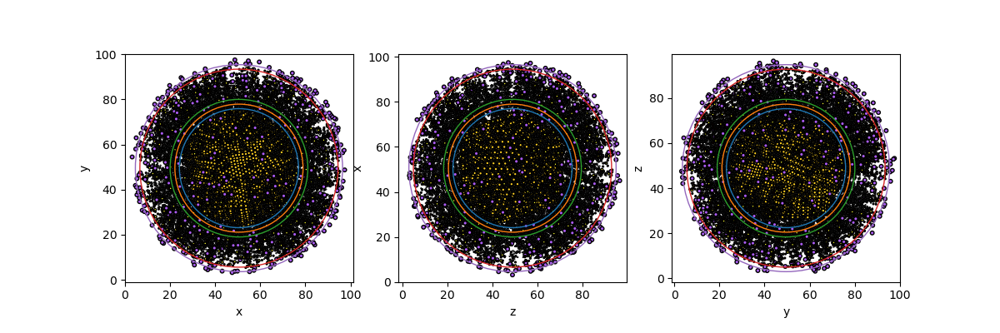

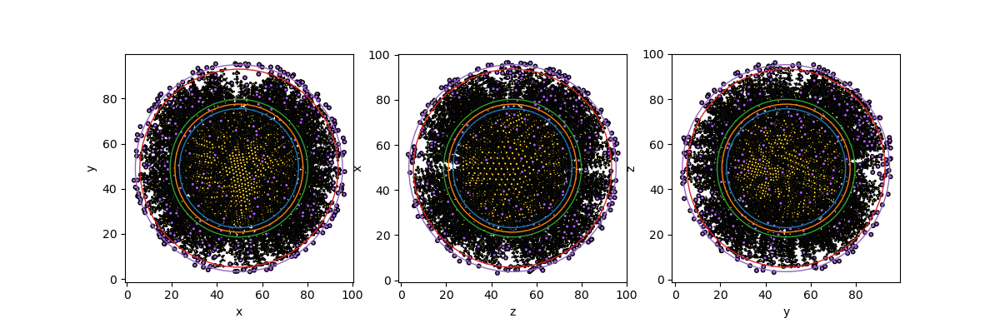

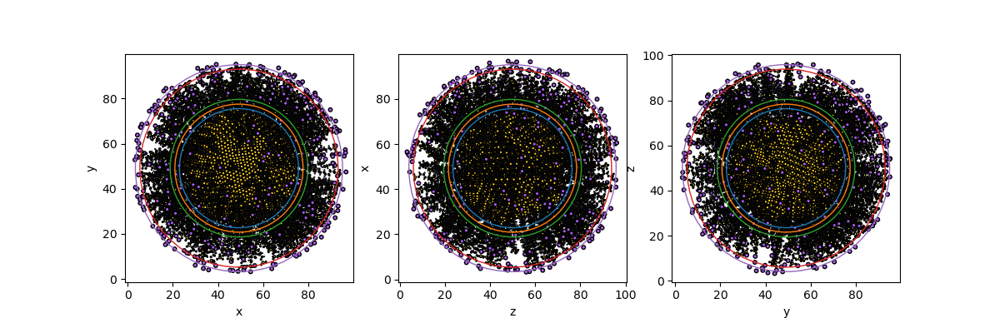

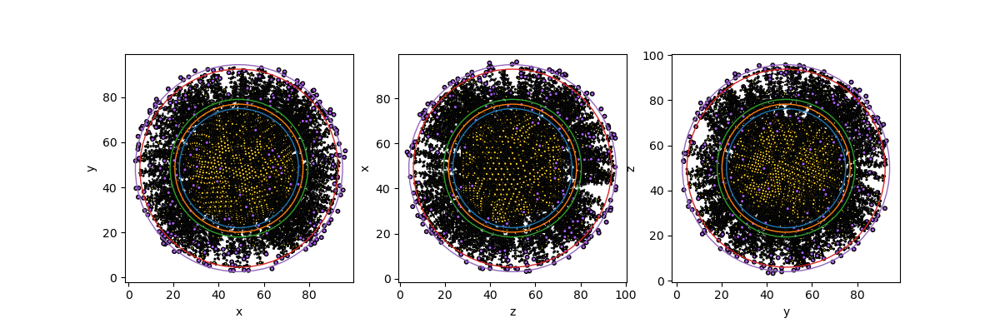

...

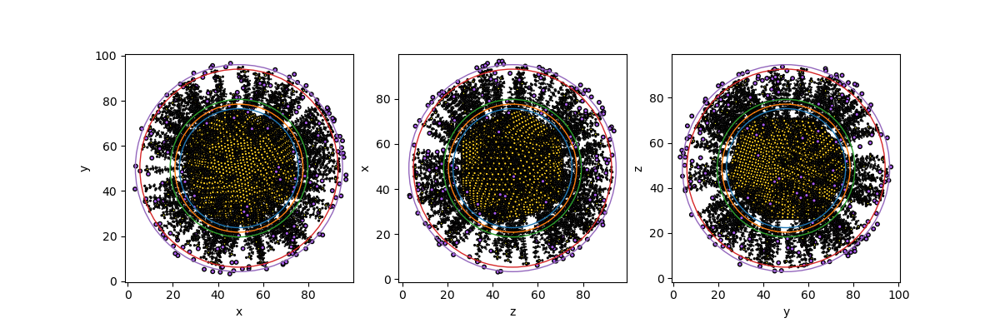

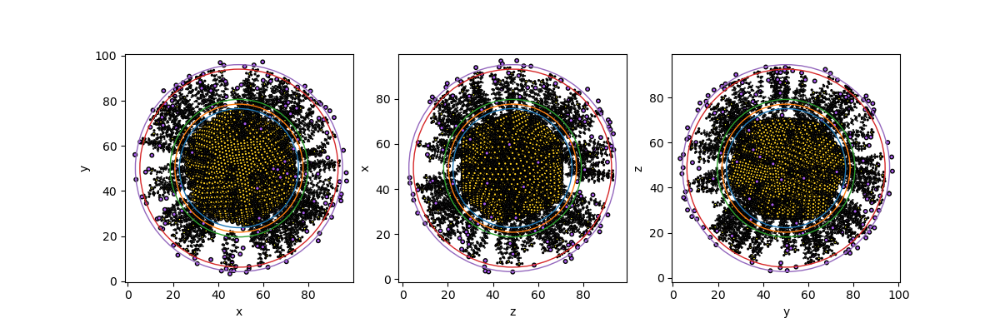

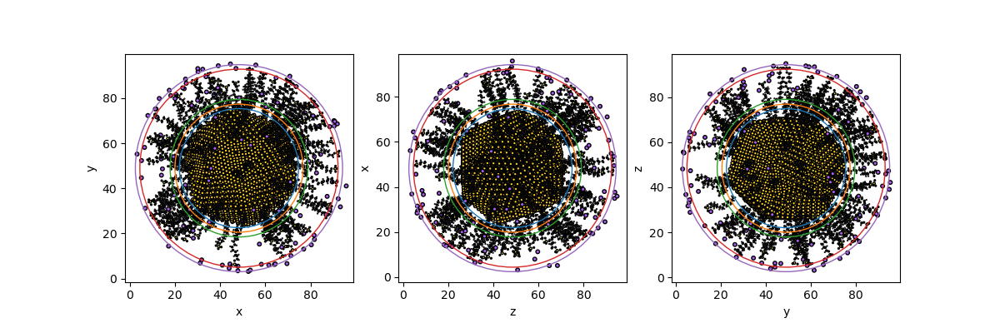

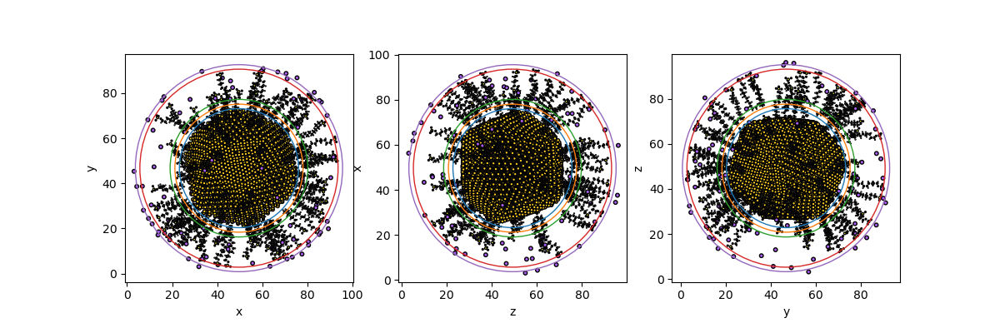

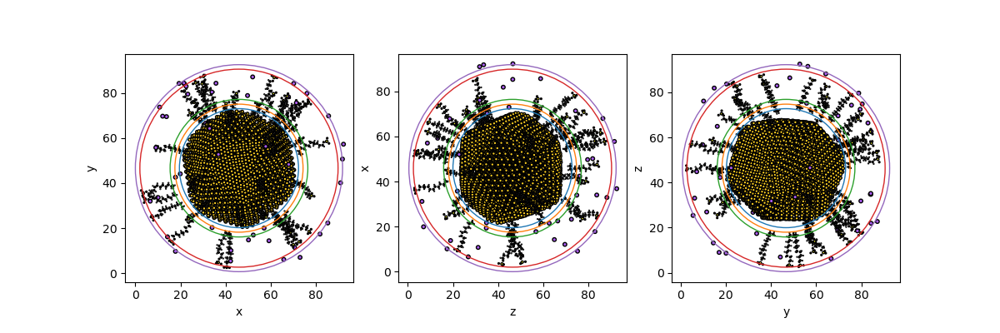

In [66]:
for obj in obj_list:
    display(obj)

## Energy minimization analysis

### Overview on objects in step

In [69]:
# queries to the data base are simple dictionaries
query = {
    'metadata.project': project_id,
    'metadata.step': 'ParametricBranching:GromacsEnergyMinimization:ProcessAnalyzeAndVisualize:push_filepad'
}

In [70]:
# use underlying MongoDB functionality to check total number of documents matching query
fp.filepad.count_documents(query)

228

In [71]:
# check files degenerate by 'metadata.type' ad 'metadata.name'
aggregation_pipeline = [
    {
        "$match": query
    },
    {  # group by unique project id
        "$group": { 
            "_id": { 
                'type': '$metadata.type',
                'name': '$metadata.name',
            },
            "object_count": {"$sum": 1}, # count matching data sets
            "earliest":  {'$min': '$metadata.datetime' },
            "latest":  {'$max': '$metadata.datetime' },
        },
    },
    {  # sort by earliest date, descending
        "$sort": { 
            "earliest": pymongo.DESCENDING,
        }
    }
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

res = [ {**c['_id'], **c} for c in cursor]
columns = ['type', 'name', 'earliest', 'latest', 'object_count', '_id']
res_df = pd.DataFrame(data=res, columns=columns) # pandas Dataframe is just nice for printing in notebook
del res_df["_id"]

In [72]:
res_df

,type,name,earliest,latest,object_count
0,mp4_file,NaN,2020-07-09 01:30:15.493255,2020-07-09 01:30:16.776401,12
1,surfactant_tail_rmsd,NaN,2020-07-09 01:30:15.493253,2020-07-09 01:30:16.776396,12
2,surfactant_head_rmsd,NaN,2020-07-09 01:30:15.493250,2020-07-09 01:30:16.776390,12
3,substrate_rmsd,NaN,2020-07-09 01:30:15.493248,2020-07-09 01:30:16.776384,12
4,counterion_rmsd,NaN,2020-07-09 01:30:15.493245,2020-07-09 01:30:16.776378,12
5,surfactant_tail_surfactant_tail_rdf,NaN,2020-07-09 01:30:15.493243,2020-07-09 01:30:16.776372,12
6,surfactant_head_surfactant_tail_rdf,NaN,2020-07-09 01:30:15.493240,2020-07-09 01:30:16.776366,12
7,surfactant_head_surfactant_head_rdf,NaN,2020-07-09 01:30:15.493238,2020-07-09 01:30:16.776360,12
8,substrate_surfactant_tail_rdf,NaN,2020-07-09 01:30:15.493235,2020-07-09 01:30:16.776353,12
9,substrate_surfactant_head_rdf,NaN,2020-07-09 01:30:15.493233,2020-07-09 01:30:16.776339,12


### Global observables

In [74]:
query = { 
    "metadata.project": project_id,
    'metadata.step': 'ParametricBranching:GromacsEnergyMinimization:ProcessAnalyzeAndVisualize:push_filepad',  #{'$regex': 'GromacsEnergyMinimization'}
    "metadata.type": 'energy_file',
}
fp.filepad.count_documents(query)

12

In [75]:
parameter_dict = {'nmolecules': 'metadata.system.surfactant.nmolecules'}

In [76]:
aggregation_pipeline = [
    {
        "$match": query
    },
    {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    },
    { 
        "$group": { 
            "_id": { field: '${}'.format(key) for field, key in parameter_dict.items() },
            "degeneracy": {"$sum": 1}, # number matching data sets
            "latest":     {"$first": "$gfs_id"} # unique gridfs id of file
        }
    },
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

In [77]:
[ c for c in cursor]

[{'_id': {'nmolecules': 306},
  'degeneracy': 1,
  'latest': '5f0674307dc9cfbf449a2729'},
 {'_id': {'nmolecules': 44},
  'degeneracy': 1,
  'latest': '5f0694b57dc9cfbf449adff5'},
 {'_id': {'nmolecules': 525},
  'degeneracy': 1,
  'latest': '5f0663417dc9cfbf4499dfb5'},
 {'_id': {'nmolecules': 88},
  'degeneracy': 1,
  'latest': '5f068a927dc9cfbf449aab63'},
 {'_id': {'nmolecules': 481},
  'degeneracy': 1,
  'latest': '5f0664207dc9cfbf4499e0c4'},
 {'_id': {'nmolecules': 438},
  'degeneracy': 1,
  'latest': '5f06649b7dc9cfbf4499e1d0'},
 {'_id': {'nmolecules': 219},
  'degeneracy': 1,
  'latest': '5f0680527dc9cfbf449a6f39'},
 {'_id': {'nmolecules': 394},
  'degeneracy': 1,
  'latest': '5f0667507dc9cfbf4499e4b5'},
 {'_id': {'nmolecules': 350},
  'degeneracy': 1,
  'latest': '5f066a657dc9cfbf4499ec88'},
 {'_id': {'nmolecules': 263},
  'degeneracy': 1,
  'latest': '5f067fd97dc9cfbf449a6e88'},
 {'_id': {'nmolecules': 175},
  'degeneracy': 1,
  'latest': '5f0689cc7dc9cfbf449aaa1e'},
 {'_id': {'n

In [78]:
res_mi_list = []

aggregation_pipeline = [
    {
        "$match": query
    },
    {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    },
    { 
        "$group": { 
            "_id": { field: '${}'.format(key) for field, key in parameter_dict.items() },
            "degeneracy": {"$sum": 1}, # number matching data sets
            "latest":     {"$first": "$gfs_id"} # unique gridfs id of file
        }
    },
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

for i, c in enumerate(cursor): 
    content, metadata = fp.get_file_by_id(c["latest"])
    with tempfile.NamedTemporaryFile(suffix='.edr') as tmp:
        tmp.write(content)
        em_df = panedr.edr_to_df(tmp.name)
        
        mi = pd.MultiIndex.from_product(
            [c["_id"].values(),em_df.index],
            names=[*c["_id"].keys(),'step'])
        em_mi_df = em_df.set_index(mi)        
        res_mi_list.append(em_mi_df)
    print('.',end='')
print('')

res_mi_df = pd.concat(res_mi_list)
res_df = res_mi_df.reset_index()

............


In [79]:
res_mi_df

Time           Bond           U-B   Proper Dih.  \
nmolecules step                                                        
306        0.0        0.0  124418.773438  73085.570312  11343.504883   
           1.0        1.0  123862.117188  73009.148438  11343.586914   
           2.0        2.0  123191.335938  72917.093750  11343.688477   
           3.0        3.0  122382.609375  72806.187500  11343.818359   
           4.0        4.0  121406.632812  72672.406250  11343.990234   
...                   ...            ...           ...           ...   
131        9994.0  9994.0     203.646118  10514.221680   3445.140381   
           9995.0  9995.0     202.983170  10516.074219   3445.141357   
           9997.0  9997.0     202.686905  10514.833984   3445.142822   
           9998.0  9998.0     203.242203  10516.381836   3445.144531   
           9999.0  9999.0     202.928757  10514.597656   3445.145508   

                         LJ-14    Coulomb-14      LJ (SR)   Coulomb (SR)  ...  \
nmolecules step                                                           ...   
306        0.0     7034.086914  81318.039062 -591056.3750 -122201.039062  ...   
           1.0     7027.479004  81314.367188 -591071.7500 -122213.195312  ...   
           2.0     7019.496094  81309.929688 -591090.1250 -122227.898438  ...   
           3.0     7009.841309  81304.570312 -591112.1250 -122245.664062  ...   
           4.0     6998.136230  81298.078125 -591138.4375 -122267.218750  ...   
...                        ...           ...          ...            ...  ...   
131        9994.0   785.364929  33701.832031 -583234.1875  -84455.656250  ...   
           9995.0   784.984802  33701.546875 -583235.3750  -84455.593750  ...   
           9997.0   785.211243  33701.703125 -583234.8125  -84455.859375  ...   
           9998.0   784.940125  33701.468750 -583235.7500  -84456.125000  ...   
           9999.0   785.273254  33701.699219 -583234.9375  -84456.484375  ...   

                   Pres-YX  Pres-YY  Pres-YZ  Pres-ZX  Pres-ZY  Pres-ZZ  \
nmolecules step                                                           
306        0.0         0.0      0.0      0.0      0.0      0.0      0.0   
           1.0         0.0      0.0      0.0      0.0      0.0      0.0   
           2.0         0.0      0.0      0.0      0.0      0.0      0.0   
           3.0         0.0      0.0      0.0      0.0      0.0      0.0   
           4.0         0.0      0.0      0.0      0.0      0.0      0.0   
...                    ...      ...      ...      ...      ...      ...   
131        9994.0      0.0      0.0      0.0      0.0      0.0      0.0   
           9995.0      0.0      0.0      0.0      0.0      0.0      0.0   
           9997.0      0.0      0.0      0.0      0.0      0.0      0.0   
           9998.0      0.0      0.0      0.0      0.0      0.0      0.0   
           9999.0      0.0      0.0      0.0      0.0      0.0      0.0   

                   #Surf*SurfTen  T-rest  
nmolecules step                           
306        0.0               0.0     0.0  
           1.0               0.0     0.0  
           2.0               0.0     0.0  
           3.0               0.0     0.0  
           4.0               0.0     0.0  
...                          ...     ...  
131        9994.0            0.0     0.0  
           9995.0            0.0     0.0  
           9997.0            0.0     0.0  
           9998.0            0.0     0.0  
           9999.0            0.0     0.0  

[93789 rows x 31 columns]

In [80]:
res_df

,nmolecules,step,Time,Bond,U-B,Proper Dih.,LJ-14,Coulomb-14,...,Pres-YX,Pres-YY,Pres-YZ,Pres-ZX,Pres-ZY,Pres-ZZ,#Surf*SurfTen,T-rest
0,306,0.0,0.0,124418.773438,73085.570312,11343.504883,7034.086914,81318.039062,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,306,1.0,1.0,123862.117188,73009.148438,11343.586914,7027.479004,81314.367188,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,306,2.0,2.0,123191.335938,72917.093750,11343.688477,7019.496094,81309.929688,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,306,3.0,3.0,122382.609375,72806.187500,11343.818359,7009.841309,81304.570312,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,306,4.0,4.0,121406.632812,72672.406250,11343.990234,6998.136230,81298.078125,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
93784,131,9994.0,9994.0,203.646118,10514.221680,3445.140381,785.364929,33701.832031,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
93785,131,9995.0,9995.0,202.983170,10516.074219,3445.141357,784.984802,33701.546875,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
93786,131,9997.0,9997.0,202.686905,10514.833984,3445.142822,785.211243,33701.703125,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
93787,131,9998.0,9998.0,203.242203,10516.381836,3445.144531,784.940125,33701.468750,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


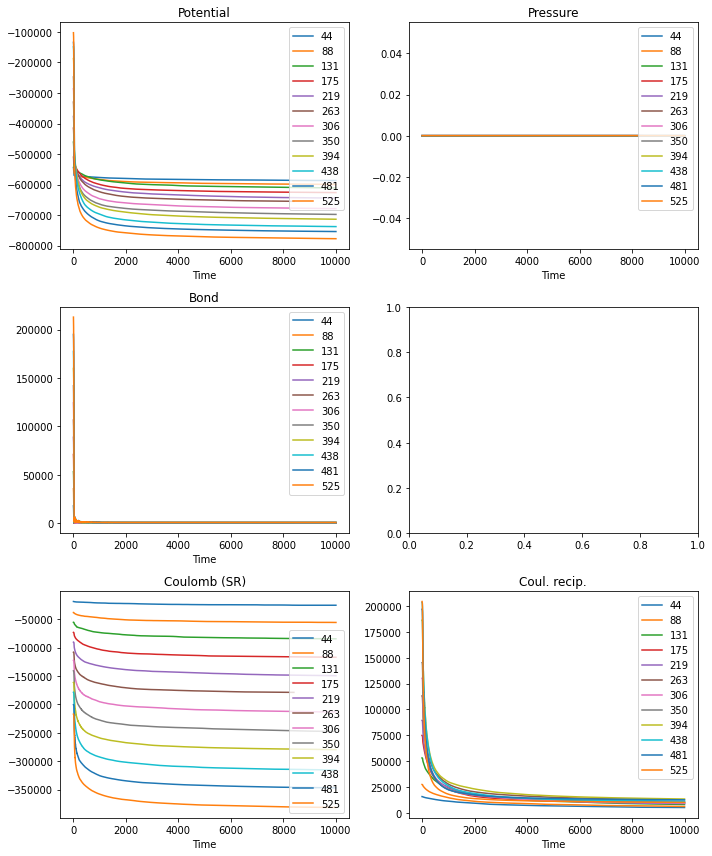

In [81]:
y_quantities = [
    'Potential',
    'Pressure',
    'Bond',
    'Coulomb (SR)',
    'Coul. recip.',
    ]

positions = [
    (0,0),
    (0,1),
    (1,0),
    (2,0),
    (2,1),
]
fig, ax = plt.subplots(3,2,figsize=(10,12))
for key, grp in res_df.groupby(['nmolecules']):
    for y_quantity, position in zip(y_quantities, positions):
        grp.plot('Time',y_quantity,ax=ax[position],label=key,title=y_quantity)
        
fig.tight_layout()

### Trajectory

In [83]:
query = { 
    "metadata.project": project_id,
    "metadata.step": 'ParametricBranching:GromacsEnergyMinimization:ProcessAnalyzeAndVisualize:push_filepad',
    "metadata.type":  { '$in': ['trajectory_file','data_file'] },
}
fp.filepad.count_documents(query)

24

In [89]:
# Building a rather sophisticated aggregation pipeline

# first group by nmolecules and type ...

parameter_dict = {
    'nmolecules': 'metadata.system.surfactant.nmolecules',
    'type': 'metadata.type'}
# parameter_names = ['nmolecules', 'type']

query = { 
    "metadata.project": project_id,
    "metadata.step": 'ParametricBranching:GromacsEnergyMinimization:ProcessAnalyzeAndVisualize:push_filepad',
    "metadata.type":  { '$in': ['trajectory_file','data_file'] },
}

aggregation_pipeline = []

aggregation_pipeline.append({ 
    "$match": query
})

aggregation_pipeline.append({ 
    "$sort": { 
        "metadata.system.surfactant.nmolecules": pymongo.ASCENDING,
        "metadata.datetime": pymongo.DESCENDING,
    }
})

aggregation_pipeline.append({ 
    "$group": { 
        "_id": { field: '${}'.format(key) for field, key in parameter_dict.items() },
        "degeneracy": {"$sum": 1}, # number matching data sets
        "latest":     {"$first": "$gfs_id"} # unique gridfs id of file
    }
})

# second group by nmolecules

parameter_dict = {
    'nmolecules': 'metadata.system.surfactant.nmolecules'}

aggregation_pipeline.append({ 
    "$group": { 
        "_id": { field: '$_id.{}'.format(field) for field in parameter_dict.keys() },
        "type":     {"$addToSet": "$_id.type"},
        "gfs_id":   {"$addToSet": "$latest"} 
        #"$_id.type": "$latest"
    }
})

aggregation_pipeline.append({
    '$project': {
         '_id': False,
        **{field: '$_id.{}'.format(field) for field in parameter_dict.keys()},
        'objects': { 
            '$zip': {
                'inputs': [ '$type', '$gfs_id' ],
                'useLongestLength': True,
                'defaults':  [None,None]
            }
        }
    }
})

aggregation_pipeline.append({ 
    '$project': {
        **{p: True for p in parameter_dict.keys()},
        'objects': {'$arrayToObject': '$objects'}
        #'objects': False 
    }
})

aggregation_pipeline.append({ 
    '$addFields': {
        'objects': {**{ field: '${}'.format(field) for field in parameter_dict.keys()}}
    }
})

aggregation_pipeline.append({ 
    '$replaceRoot': { 'newRoot': '$objects' }
})

# display results with
# for i, c in enumerate(cursor): 
#    print(c)
# yields documents in the form
# {'em_gro': '5e6a4e3d6c26f976ceae5e38', 'em_trr': '5e6a4e3a6c26f976ceae5e14', 'nmolecules': '44'}
# i.e. most recent topology file and trajectory file per concentration

cursor = fp.filepad.aggregate(aggregation_pipeline)

mda_trr_list = []
for i, c in enumerate(cursor): 
    em_gro_content, _ = fp.get_file_by_id(c["data_file"])
    em_trr_content, _ = fp.get_file_by_id(c["trajectory_file"])
    # Stream approach won't work
    # with io.TextIOWrapper( io.BytesIO(em_gro_content) ) as gro, \
    #    io.BytesIO(em_trr_content) as trr:   
        #mda_trr_list.append( 
        #    mda.Universe( 
        #        gro,trr, topology_format = 'GRO', format='TRR') )
    with tempfile.NamedTemporaryFile(suffix='.gro') as gro, \
        tempfile.NamedTemporaryFile(suffix='.trr') as trr:
        gro.write(em_gro_content)
        trr.write(em_trr_content)
        mda_trr_list.append( mda.Universe(gro.name,trr.name) )
    print('.',end='')
print('')
del em_gro_content
del em_trr_content

ValueError: Failed to construct topology from file /tmp/tmp155aolvb.gro with parser <class 'MDAnalysis.topology.GROParser.GROParser'>.
Error: 'utf-8' codec can't decode byte 0xc9 in position 3: invalid continuation byte

In [86]:
mda_trr = mda_trr_list[0]

mda_view = nglview.show_mdanalysis(mda_trr)

mda_view.clear_representations()
mda_view.background = 'white'
mda_view.add_representation('ball+stick')
mda_view

IndexError: list index out of range

###  Rendered videos

In [92]:
query = {
    'metadata.project': project_id,
    'metadata.step': 'ParametricBranching:GromacsEnergyMinimization:ProcessAnalyzeAndVisualize:push_filepad',
    'metadata.type': 'mp4_file',
}

In [93]:
# use underlying MongoDB functionality to check total number of documents matching query
fp.filepad.count_documents(query)

12

In [94]:
# check files degenerate by 'metadata.type' ad 'metadata.name'

aggregation_pipeline = [
    {
        "$match": query
    },
    {  # group by unique project id
        "$group": { 
            "_id": { 
                'type': '$metadata.type',
                'name': '$metadata.name',
                'step': '$metadata.step',
            },
            "object_count": {"$sum": 1}, # count matching data sets
            "earliest":  {'$min': '$metadata.datetime' },
            "latest":  {'$max': '$metadata.datetime' },
        },
    },
    {  # sort by earliest date, descending
        "$sort": { 
            "earliest": pymongo.DESCENDING,
        }
    }
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

res = [ {**c['_id'], **c} for c in cursor]
columns = ['step', 'type', 'name', 'earliest', 'latest', 'object_count', '_id']
res_df = pd.DataFrame(data=res, columns=columns) # pandas Dataframe is just nice for printing in notebook
del res_df["_id"]

In [95]:
res_df

,step,type,name,earliest,latest,object_count
0,ParametricBranching:GromacsEnergyMinimization:ProcessAnalyzeAndVisualize:push_filepad,mp4_file,NaN,2020-07-09 01:30:15.493255,2020-07-09 01:30:16.776401,12


In [96]:
aggregation_pipeline = [
    {
        "$match": query
    },
    {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    },
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

obj_list = []
for i, c in enumerate(cursor): 
    content, metadata = fp.get_file_by_id(c["gfs_id"])
    with tempfile.NamedTemporaryFile(suffix='.mp4',delete=False) as tmp:
        tmp.write(content)
        # obj_list.append(Video(filename=tmp.name)) 
        # obj_list.append(tmp.name)
        obj_list.append(Video.from_file(tmp.name))
    print('.',end='')

............

In [98]:
obj_list[-1]

Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x08v\x03mdat\x00\x…

## Pulling analysis

### Overview on objects in step

In [17]:
# queries to the data base are simple dictionaries
query = {
    'metadata.project': project_id,
    'metadata.step': 'ParametricBranching:GromacsPull:ProcessAnalyzeAndVisualize:push_filepad'
}

In [18]:
# use underlying MongoDB functionality to check total number of documents matching query
fp.filepad.count_documents(query)

276

In [19]:
# check files degenerate by 'metadata.type' ad 'metadata.name'
aggregation_pipeline = [
    {
        "$match": query
    },
    {  # group by unique project id
        "$group": { 
            "_id": { 
                'type': '$metadata.type',
                'name': '$metadata.name',
            },
            "object_count": {"$sum": 1}, # count matching data sets
            "earliest":  {'$min': '$metadata.datetime' },
            "latest":  {'$max': '$metadata.datetime' },
        },
    },
    {  # sort by earliest date, descending
        "$sort": { 
            "earliest": pymongo.DESCENDING,
        }
    }
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

res = [ {**c['_id'], **c} for c in cursor]
columns = ['type', 'name', 'earliest', 'latest', 'object_count', '_id']
res_df = pd.DataFrame(data=res, columns=columns) # pandas Dataframe is just nice for printing in notebook
del res_df["_id"]

In [20]:
res_df

,type,name,earliest,latest,object_count
0,mp4_file,NaN,2020-07-09 01:30:15.514376,2020-07-09 01:30:16.787594,12
1,surfactant_tail_rmsd,NaN,2020-07-09 01:30:15.514373,2020-07-09 01:30:16.787591,12
2,surfactant_head_rmsd,NaN,2020-07-09 01:30:15.514371,2020-07-09 01:30:16.787589,12
3,substrate_rmsd,NaN,2020-07-09 01:30:15.514369,2020-07-09 01:30:16.787587,12
4,counterion_rmsd,NaN,2020-07-09 01:30:15.514366,2020-07-09 01:30:16.787584,12
5,surfactant_tail_surfactant_tail_rdf,NaN,2020-07-09 01:30:15.514364,2020-07-09 01:30:16.787582,12
6,surfactant_head_surfactant_tail_rdf,NaN,2020-07-09 01:30:15.514361,2020-07-09 01:30:16.787579,12
7,surfactant_head_surfactant_head_rdf,NaN,2020-07-09 01:30:15.514359,2020-07-09 01:30:16.787577,12
8,substrate_surfactant_tail_rdf,NaN,2020-07-09 01:30:15.514356,2020-07-09 01:30:16.787574,12
9,substrate_surfactant_head_rdf,NaN,2020-07-09 01:30:15.514354,2020-07-09 01:30:16.787572,12


### Global observables

The `gmx energy` table:

```
  1  Restraint-Pot.   2  U-B              3  Proper-Dih.      4  LJ-14         
  5  Coulomb-14       6  LJ-(SR)          7  Coulomb-(SR)     8  Coul.-recip.  
  9  Position-Rest.  10  COM-Pull-En.    11  Potential       12  Kinetic-En.   
 13  Total-Energy    14  Temperature     15  Pressure        16  Constr.-rmsd  
 17  Vir-XX          18  Vir-XY          19  Vir-XZ          20  Vir-YX        
 21  Vir-YY          22  Vir-YZ          23  Vir-ZX          24  Vir-ZY        
 25  Vir-ZZ          26  Pres-XX         27  Pres-XY         28  Pres-XZ       
 29  Pres-YX         30  Pres-YY         31  Pres-YZ         32  Pres-ZX       
 33  Pres-ZY         34  Pres-ZZ         35  #Surf*SurfTen   36  T-rest       
 ```
 converted to dict with regex
 
     \s+([0-9]+)\s+([^\s]+)
 
 and replacement
 
     '$2': $1,\n

In [21]:
gmx_energy_dict = {
    'Restraint-Pot.': 1,
    'U-B': 2,
    'Proper-Dih.': 3,
    'LJ-14': 4,
    'Coulomb-14': 5,
    'LJ-(SR)': 6,
    'Coulomb-(SR)': 7,
    'Coul.-recip.': 8,
    'Position-Rest.': 9,
    'COM-Pull-En.': 10,
    'Potential': 11,
    'Kinetic-En.': 12,
    'Total-Energy': 13,
    'Temperature': 14,
    'Pressure': 15,
    'Constr.-rmsd': 16,
    'Vir-XX': 17,
    'Vir-XY': 18,
    'Vir-XZ': 19,
    'Vir-YX': 20,
    'Vir-YY': 21,
    'Vir-YZ': 22,
    'Vir-ZX': 23,
    'Vir-ZY': 24,
    'Vir-ZZ': 25,
    'Pres-XX': 26,
    'Pres-XY': 27,
    'Pres-XZ': 28,
    'Pres-YX': 29,
    'Pres-YY': 30,
    'Pres-YZ': 31,
    'Pres-ZX': 32,
    'Pres-ZY': 33,
    'Pres-ZZ': 34,
    '#Surf*SurfTen': 35,
    'T-rest': 36,
}

In [22]:
query = { 
    "metadata.project": project_id,
    "metadata.type":    'energy_file',
    "metadata.step": "ParametricBranching:GromacsPull:ProcessAnalyzeAndVisualize:push_filepad",
}

fp.filepad.count_documents(query)

12

In [23]:
parameter_dict = {
    'nmolecules': 'metadata.system.surfactant.nmolecules'}

In [24]:
gmx_energy_selection = [
    'Restraint-Pot.',
    'Position-Rest.',
    'COM-Pull-En.',
    'Potential',
    'Kinetic-En.',
    'Total-Energy',
    'Temperature',
    'Pressure',
    'Constr.-rmsd',
]

In [25]:
res_list = []
failed_list = []

match_aggregation = {
        "$match": query
    }
sort_aggregation = {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    }
group_aggregation = { 
    "$group": { 
        "_id": { field: '${}'.format(key) for field, key in parameter_dict.items() },
        "degeneracy": {"$sum": 1}, # number matching data sets
        "latest":     {"$first": "$gfs_id"} # unique gridfs id of file
    }
}
aggregation_pipeline = [ match_aggregation, sort_aggregation, group_aggregation ]
cursor = fp.filepad.aggregate(aggregation_pipeline)

res_df_list = []
for i, c in enumerate(cursor): 
    content, metadata = fp.get_file_by_id(c["latest"])
    nmolecules = int(c["_id"]["nmolecules"])
    
    #df = panedr.edr_to_df(tmp.name), fails
    tmpin = tempfile.NamedTemporaryFile(mode='w+b',suffix='.edr', delete=False)
    
    # cur_res_dict = {}
    with tmpin:
        tmpin.write(content)
        #tmpin.seek(0)
       
    res_df = None
    for sel in gmx_energy_selection:  
        try:
            tmpout = tempfile.NamedTemporaryFile(suffix='.xvg', delete=False)
            res = gromacs.energy(f=tmpin.name,o=tmpout.name,
                                 input=str(gmx_energy_dict[sel]))
            #with open(tmpout.name,'r') as f:
            #    xvg = f.read()
            #tmpout.delete()
            xvg = mda.auxiliary.XVG.XVGReader(tmpout.name)
            xvg_time = xvg.read_all_times()
            xvg_data = np.array([ f.data[1:] for f in xvg ]).flatten() # 1st entry contains times
            os.unlink(tmpout.name)
        except: 
            logger.warning("Failed to read '{:s}' from data set {:d}.".format(sel,i))
            failed_list.append((nmolecules, sel))
        else:
            r = {'nmolecules': [nmolecules]*len(xvg_time), 'time': xvg_time, sel: xvg_data}
            cur_df = pd.DataFrame(r)
            if res_df is None:
                res_df = cur_df
            else:
                res_df = pd.merge(res_df, cur_df, how='outer', on=['nmolecules', 'time'])
    res_df_list.append(res_df)
    os.unlink(tmpin.name)
    print('.',end='')
print('')
res_df = pd.concat(res_df_list)
res_df_mi = res_df.set_index(['nmolecules','time'])

............


In [27]:
res_df_mi

Restraint-Pot.  Position-Rest.  COM-Pull-En.    Potential  \
nmolecules time                                                              
306        0.0      7031.586914        0.000000      0.001686 -671124.8750   
           0.2       399.287201      163.539291    263.659607 -675284.5625   
           0.4       407.408813      368.645813    480.917938 -676434.0625   
           0.6       461.685181      814.757324    902.301514 -676609.6250   
           0.8       441.735321     1231.140625   1313.032349 -676190.5000   
...                         ...             ...           ...          ...   
44         1.2        27.327681      166.368652    187.659424 -587116.6250   
           1.4        32.520138      265.443604    170.982346 -587168.5625   
           1.6        33.898804      334.627075    174.498428 -587258.0000   
           1.8        56.819633      380.152008    170.386108 -587446.0625   
           2.0        58.596825      379.724152    165.710358 -587490.4375   

                 Kinetic-En.  Total-Energy  Temperature     Pressure  \
nmolecules time                                                        
306        0.0     58.651764  -671066.2500     0.523988  3026.758545   
           0.2   4311.048828  -670973.5000    38.514393  2849.341309   
           0.4   5720.614258  -670713.4375    51.107281  3003.247803   
           0.6   6233.531250  -670376.1250    55.689621  3057.637451   
           0.8   6247.245117  -669943.2500    55.812134  3064.695801   
...                      ...           ...          ...          ...   
44         1.2   1162.453857  -585954.1875    72.272461  2990.296631   
           1.4   1249.532227  -585919.0000    77.686325  2977.302490   
           1.6   1362.636475  -585895.3750    84.718277  2962.027344   
           1.8   1566.714966  -585879.3750    97.406311  2958.099609   
           2.0   1629.716431  -585860.7500   101.323257  2970.756348   

                 Constr.-rmsd  
nmolecules time                
306        0.0       0.000002  
           0.2       0.000002  
           0.4       0.000002  
           0.6       0.000002  
           0.8       0.000002  
...                       ...  
44         1.2       0.000002  
           1.4       0.000002  
           1.6       0.000002  
           1.8       0.000002  
           2.0       0.000003  

[132 rows x 9 columns]

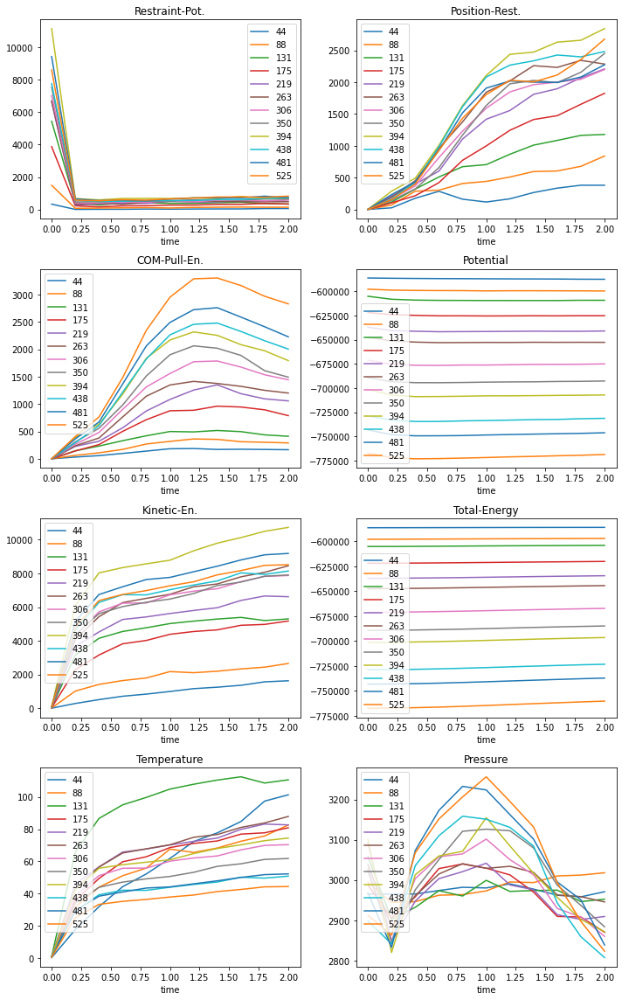

In [28]:
cols = 2
y_quantities = [
    'Restraint-Pot.',
    'Position-Rest.',
    'COM-Pull-En.',
    'Potential',
    'Kinetic-En.',
    'Total-Energy',
    'Temperature',
    'Pressure',
    'Constr.-rmsd',
    ]
n = len(y_quantities)
rows = round(n/cols)
positions = [(i,j) for i in range(rows) for j in range(cols)][:n]
fig, ax = plt.subplots(rows,cols,figsize=(5*cols,4*rows))
for key, grp in res_df.groupby(['nmolecules']):
    for y_quantity, position in zip(y_quantities, positions):
        grp.plot('time',y_quantity,ax=ax[position],label=key,title=y_quantity)
        
fig.tight_layout()

### Pulling forces

In [30]:
res_df_list = []
failed_list = []

query = { 
    "metadata.project": project_id,
    "metadata.step": "ParametricBranching:GromacsPull:ProcessAnalyzeAndVisualize:push_filepad",
    "metadata.type": 'pullf_file',
}

fp.filepad.count_documents(query)
match_aggregation = {
        "$match": query
    }
sort_aggregation = {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    }
group_aggregation = { 
    "$group": { 
        "_id": { field: '${}'.format(key) for field, key in parameter_dict.items() },
        "degeneracy": {"$sum": 1}, # number matching data sets
        "latest":     {"$first": "$gfs_id"} # unique gridfs id of file
    }
}
aggregation_pipeline = [ match_aggregation, sort_aggregation, group_aggregation ]
cursor = fp.filepad.aggregate(aggregation_pipeline)

for i, c in enumerate(cursor): 
    content, metadata = fp.get_file_by_id(c["latest"])
    nmolecules = int(c["_id"]["nmolecules"])
    
    tmpin = tempfile.NamedTemporaryFile(mode='w+b',suffix='.xvg', delete=False)
    
    with tmpin:
        tmpin.write(content)
        
    try:
        xvg = mda.auxiliary.XVG.XVGReader(tmpin.name)
        xvg_time = xvg.read_all_times()
        xvg_data = np.array([ f.data[1:] for f in xvg ])# .flatten() # 1st entry contains times
    except: 
        logger.warning("Failed to read data set {:d}.".format(i))
        failed_list.append(nmolecules)
    else:
        res_df_list.append(pd.DataFrame({
            'nmolecules': np.array([nmolecules]*len(xvg_time), dtype=int),
            'time': xvg_time, 
            **{i: xvg_data[:,i] for i in range(nmolecules)}
        }))
    os.unlink(tmpin.name)
    print('.',end='')
print('')
res_df = pd.concat(res_df_list)
res_df_mi = res_df.set_index(['nmolecules','time'])

............


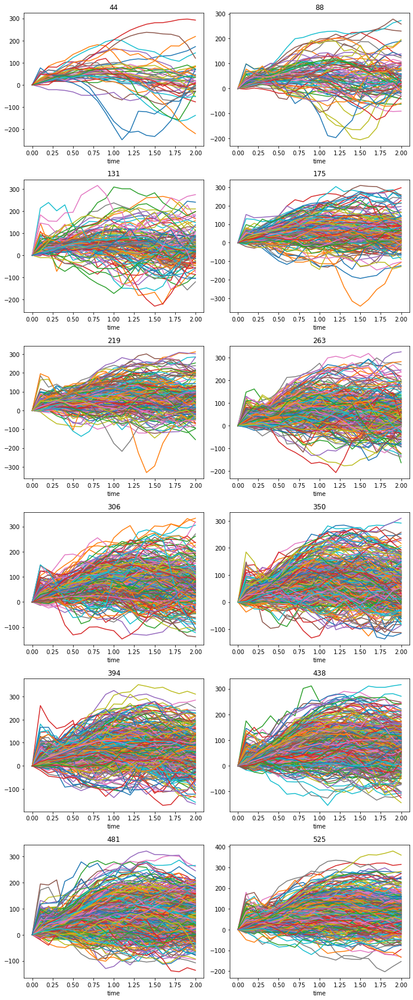

In [31]:
n = len(res_df['nmolecules'].unique())
cols = 2
rows = round(n/cols)
if rows > 1:
    positions = [(i,j) for i in range(rows) for j in range(cols)][:n]
else:
    positions = [i for i in range(cols)][:n]
    
fig, ax = plt.subplots(rows,cols,figsize=(5*cols,4*rows))
for pos, (key, grp) in zip(positions,res_df.groupby(['nmolecules'])):
    columns = list(set(grp.columns) - set(['nmolecules','time']))
    grp.plot('time', columns, ax=ax[pos],title=key,legend=None)
fig.tight_layout()

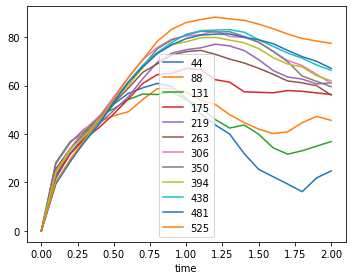

In [32]:
fig, ax = plt.subplots(1,1,figsize=(5,4))
for key, grp in res_df.groupby(['nmolecules']):
    columns = list(set(grp.columns) - set(['nmolecules','time']))
    grp = grp.set_index('time')
    grp = grp.drop(columns='nmolecules')
    grp.mean(axis=1).plot(legend=True, label=key, ax=ax)
fig.tight_layout()
#fig.legend()

### Pulling groups movement

In [34]:
res_df_list = []
failed_list = []

query = { 
    "metadata.project": project_id,
    "metadata.step": "ParametricBranching:GromacsPull:ProcessAnalyzeAndVisualize:push_filepad",
    "metadata.type":    'pullx_file',
}

fp.filepad.count_documents(query)
match_aggregation = {
        "$match": query
    }
sort_aggregation = {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    }
group_aggregation = { 
    "$group": { 
        "_id": { field: '${}'.format(key) for field, key in parameter_dict.items() },
        "degeneracy": {"$sum": 1}, # number matching data sets
        "latest":     {"$first": "$gfs_id"} # unique gridfs id of file
    }
}
aggregation_pipeline = [ match_aggregation, sort_aggregation, group_aggregation ]
cursor = fp.filepad.aggregate(aggregation_pipeline)


for i, c in enumerate(cursor): 
    print(c["_id"])
    content, metadata = fp.get_file_by_id(c["latest"])
    nmolecules = int(c["_id"]["nmolecules"])  # int(metadata["metadata"]["nmolecules"])
    
    tmpin = tempfile.NamedTemporaryFile(mode='w+b',suffix='.xvg', delete=False)
    
    with tmpin:
        tmpin.write(content)
        
    try:
        xvg = gromacs.fileformats.XVG(tmpin.name)
        xvg_time = xvg.array[0,:]
        
        #xvg_labels = ['1', '1 ref', '1 dX', '1 dY', '1 dZ', '1 g 1 X', '1 g 1 Y', '1 g 1 Z', '1 g 2 X', '1 g 2 Y', '1 g 2 Z']
        N_pull_coords = nmolecules
        N_cols = len(xvg.names)
        N_cols_per_coord = int(N_cols / N_pull_coords)
        
        xvg_labels = xvg.names[:N_cols_per_coord]
        xvg_data = {}
        for j in range(N_pull_coords):
            for k in range(N_cols_per_coord):
                xvg_data[(j,xvg_labels[k])] = xvg.array[
                    1+j*N_cols_per_coord+k,:]
        
    except: 
        logger.exception("Failed to read data set {:d}.".format(i))
        failed_list.append(nmolecules)

    else:
        # res_list.append({
        #    'nmolecules': nmolecules, # np.array([nmolecules]*len(xvg_time), dtype=int),
        #    'time': xvg_time, 
        #    **xvg_data})
        res_df_list.append(pd.DataFrame({
            'nmolecules': np.array([nmolecules]*len(xvg_time), dtype=int),
            'time': xvg_time, 
            **xvg_data # {i: xvg_data[:,i] for i in range(nmolecules)}
        }))
    #os.unlink(tmpin.name)
    #print('.',end='')
#print('')
res_df = pd.concat(res_df_list)
res_df_mi = res_df.set_index(['nmolecules','time'])
res_df_mi.columns = pd.MultiIndex.from_tuples(res_df_mi.columns, names=['nmolecule', 'coord'])

{'nmolecules': 306}
{'nmolecules': 44}
{'nmolecules': 525}
{'nmolecules': 88}
{'nmolecules': 481}
{'nmolecules': 438}
{'nmolecules': 219}
{'nmolecules': 394}
{'nmolecules': 350}
{'nmolecules': 263}
{'nmolecules': 175}
{'nmolecules': 131}


In [35]:
res_df_mi

nmolecule            0                                                  \
coord                  1    1 ref      1 dX     1 dY      1 dZ 1 g 1 X   
nmolecules time                                                          
306        0.0   2.99688  2.99656  2.234560 -1.98988  0.168659   6.785   
           0.2   2.98128  3.01656  2.212180 -1.99218  0.159762   6.785   
           0.4   2.96838  3.03656  2.215250 -1.97014  0.149943   6.785   
           0.6   2.94686  3.05656  2.203310 -1.94835  0.182654   6.785   
           0.8   2.92555  3.07656  2.171630 -1.94456  0.248140   6.785   
...                  ...      ...       ...      ...       ...     ...   
131        1.2   3.14826  3.21024 -0.853757 -1.51078  2.626820   6.785   
           1.4   3.16664  3.23024 -0.903389 -1.49367  2.642060   6.785   
           1.6   3.17031  3.25024 -0.941155 -1.46587  2.648840   6.785   
           1.8   3.19711  3.27024 -0.989481 -1.42622  2.684830   6.785   
           2.0   3.20565  3.29024 -1.002790 -1.41113  2.698030   6.785   

nmolecule                                          ...   524                 \
coord           1 g 1 Y 1 g 1 Z  1 g 2 X  1 g 2 Y  ... 1 ref 1 dX 1 dY 1 dZ   
nmolecules time                                    ...                        
306        0.0    6.759   6.790  9.01956  4.76911  ...   NaN  NaN  NaN  NaN   
           0.2    6.759   6.790  8.99718  4.76682  ...   NaN  NaN  NaN  NaN   
           0.4    6.759   6.790  9.00025  4.78885  ...   NaN  NaN  NaN  NaN   
           0.6    6.759   6.790  8.98831  4.81065  ...   NaN  NaN  NaN  NaN   
           0.8    6.759   6.790  8.95663  4.81444  ...   NaN  NaN  NaN  NaN   
...                 ...     ...      ...      ...  ...   ...  ...  ...  ...   
131        1.2    6.624   6.675  5.93125  5.11321  ...   NaN  NaN  NaN  NaN   
           1.4    6.624   6.675  5.88162  5.13033  ...   NaN  NaN  NaN  NaN   
           1.6    6.624   6.675  5.84385  5.15812  ...   NaN  NaN  NaN  NaN   
           1.8    6.624   6.675  5.79552  5.19778  ...   NaN  NaN  NaN  NaN   
           2.0    6.624   6.675  5.78222  5.21286  ...   NaN  NaN  NaN  NaN   

nmolecule                                                        
coord           1 g 1 X 1 g 1 Y 1 g 1 Z 1 g 2 X 1 g 2 Y 1 g 2 Z  
nmolecules time                                                  
306        0.0      NaN     NaN     NaN     NaN     NaN     NaN  
           0.2      NaN     NaN     NaN     NaN     NaN     NaN  
           0.4      NaN     NaN     NaN     NaN     NaN     NaN  
           0.6      NaN     NaN     NaN     NaN     NaN     NaN  
           0.8      NaN     NaN     NaN     NaN     NaN     NaN  
...                 ...     ...     ...     ...     ...     ...  
131        1.2      NaN     NaN     NaN     NaN     NaN     NaN  
           1.4      NaN     NaN     NaN     NaN     NaN     NaN  
           1.6      NaN     NaN     NaN     NaN     NaN     NaN  
           1.8      NaN     NaN     NaN     NaN     NaN     NaN  
           2.0      NaN     NaN     NaN     NaN     NaN     NaN  

[132 rows x 5775 columns]

In [36]:
res_df = res_df_mi.groupby(axis=1,level='coord').mean().reset_index()

In [37]:
res_df

coord,nmolecules,time,1,1 dX,1 dY,1 dZ,1 g 1 X,1 g 1 Y,1 g 1 Z,1 g 2 X,1 g 2 Y,1 g 2 Z,1 ref
0,306,0.0,3.030811,-0.003623,0.015265,0.000827,6.785,6.759,6.790,6.781381,6.774262,6.790828,3.030759
1,306,0.2,3.016804,-0.005029,0.012748,-0.000155,6.785,6.759,6.790,6.779975,6.771745,6.789846,3.050759
2,306,0.4,3.023511,-0.003008,0.012060,-0.001445,6.785,6.759,6.790,6.781996,6.771057,6.788555,3.070759
3,306,0.6,3.027459,-0.002068,0.012372,-0.001094,6.785,6.759,6.790,6.782937,6.771369,6.788907,3.090759
4,306,0.8,3.035076,-0.000224,0.013153,-0.000372,6.785,6.759,6.790,6.784780,6.772150,6.789629,3.110759
...,...,...,...,...,...,...,...,...,...,...,...,...,...
127,131,1.2,3.111250,0.021083,0.208217,0.162973,6.785,6.624,6.675,6.806087,6.832213,6.837974,3.157227
128,131,1.4,3.133500,0.015456,0.202484,0.163395,6.785,6.624,6.675,6.800462,6.826481,6.838397,3.177227
129,131,1.6,3.162940,0.011403,0.199794,0.164100,6.785,6.624,6.675,6.796407,6.823791,6.839101,3.197227
130,131,1.8,3.184166,0.011572,0.192103,0.161455,6.785,6.624,6.675,6.796577,6.816100,6.836456,3.217227


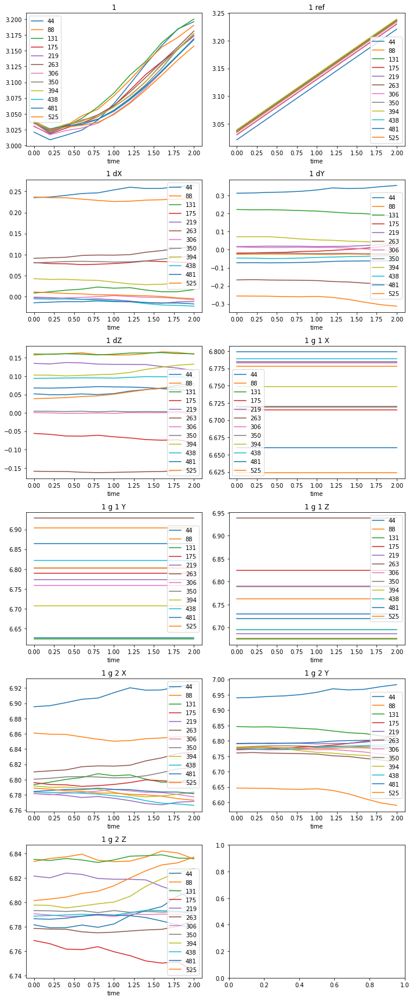

In [38]:
cols = 2
y_quantities = [
    '1', 
    '1 ref', 
    '1 dX', 
    '1 dY', 
    '1 dZ', 
    '1 g 1 X', 
    '1 g 1 Y', 
    '1 g 1 Z', 
    '1 g 2 X', 
    '1 g 2 Y', 
    '1 g 2 Z'
]
n = len(y_quantities)
rows = round(n/cols)
positions = [(i,j) for i in range(rows) for j in range(cols)][:n]
fig, ax = plt.subplots(rows,cols,figsize=(5*cols,4*rows))
for key, grp in res_df.groupby(['nmolecules']):
    for y_quantity, position in zip(y_quantities, positions):
        grp.plot('time',y_quantity,ax=ax[position],label=key,title=y_quantity)
        
fig.tight_layout()

### Visualize trajectory

In [138]:
parameter_dict = {
    'nmolecules': 'metadata.system.surfactant.nmolecules',
    'type': 'metadata.type'}

query = { 
    "metadata.project": project_id,
    "metadata.step": "GromacsPull:ProcessAnalyzeAndVisualize:push_filepad",
    "metadata.type": { '$in': ['trajectory_file','data_file'] },
}

aggregation_pipeline = []

aggregation_pipeline.append({ 
    "$match": query
})



aggregation_pipeline.append({ 
    "$sort": { 
        "metadata.system.surfactant.nmolecules": pymongo.ASCENDING,
        "metadata.datetime": pymongo.DESCENDING,
    }
})

aggregation_pipeline.append({ 
    "$group": { 
        "_id": { field: '${}'.format(key) for field, key in parameter_dict.items() },
        "degeneracy": {"$sum": 1}, # number matching data sets
        "latest":     {"$first": "$gfs_id"} # unique gridfs id of file
    }
})

parameter_dict = {
    'nmolecules': 'metadata.system.surfactant.nmolecules'}

aggregation_pipeline.append({ 
    "$group": { 
        "_id": { p: '$_id.{}'.format(p) for p in parameter_dict.keys() },
        "type":     {"$addToSet": "$_id.type"},
        "gfs_id":   {"$addToSet": "$latest"} 
        #"$_id.type": "$latest"
    }
})

aggregation_pipeline.append({
    '$project': {
         '_id': False,
        **{ p: '$_id.{}'.format(p) for p in parameter_dict.keys()},
        'objects': { 
            '$zip': {
                'inputs': [ '$type', '$gfs_id' ],
                'useLongestLength': True,
                'defaults':  [None,None]
            }
        }
    }
})

aggregation_pipeline.append({ 
    '$project': {
        **{ p: True for p in parameter_dict.keys()},
        'objects': {'$arrayToObject': '$objects'}
        #'objects': False 
    }
})

aggregation_pipeline.append({ 
    '$addFields': {
        'objects': {**{ p: '${}'.format(p) for p in parameter_dict.keys()}}
    }
})

aggregation_pipeline.append({ 
    '$replaceRoot': { 'newRoot': '$objects' }
})

# display results with
# for i, c in enumerate(cursor): 
#    print(c)
# yields documents in the form
# {'em_gro': '5e6a4e3d6c26f976ceae5e38', 'em_trr': '5e6a4e3a6c26f976ceae5e14', 'nmolecules': '44'}
# i.e. most recent topology file and trajectory file per concentration

cursor = fp.filepad.aggregate(aggregation_pipeline)

In [139]:
failed_list = []
mda_trr_list = []
for i, c in enumerate(cursor): 
    try:
        gro_content, _ = fp.get_file_by_id(c["data_file"])
        trr_content, _ = fp.get_file_by_id(c["trajectory_file"])
        with tempfile.NamedTemporaryFile(suffix='.gro') as gro, \
            tempfile.NamedTemporaryFile(suffix='.trr') as trr:
            gro.write(gro_content)
            trr.write(trr_content)
            mda_trr_list.append( mda.Universe(gro.name,trr.name) )
    except: 
        logger.exception("Failed to read data set {}.".format(c))
        failed_list.append(c)
    print('.',end='')
print('')

.


/home/jotelha/venv/jlh-imtek-nb-python-3.6/lib/python3.6/site-packages/MDAnalysis/topology/guessers.py:80: UserWarning: Failed to guess the mass for the following atom types: A
  warnings.warn("Failed to guess the mass for the following atom types: {}".format(atom_type))


In [140]:
failed_list

[]

In [141]:
mda_trr = mda_trr_list[0]

mda_view = nglview.show_mdanalysis(mda_trr)

mda_view.clear_representations()
mda_view.background = 'white'
mda_view.add_representation('ball+stick')
mda_view

/home/jotelha/venv/jlh-imtek-nb-python-3.6/lib/python3.6/site-packages/MDAnalysis/coordinates/PDB.py:916: UserWarning: Found no information for attr: 'altLocs' Using default value of ' '
  "".format(attrname, default))
/home/jotelha/venv/jlh-imtek-nb-python-3.6/lib/python3.6/site-packages/MDAnalysis/coordinates/PDB.py:916: UserWarning: Found no information for attr: 'icodes' Using default value of ' '
  "".format(attrname, default))
/home/jotelha/venv/jlh-imtek-nb-python-3.6/lib/python3.6/site-packages/MDAnalysis/coordinates/PDB.py:916: UserWarning: Found no information for attr: 'occupancies' Using default value of '1.0'
  "".format(attrname, default))
/home/jotelha/venv/jlh-imtek-nb-python-3.6/lib/python3.6/site-packages/MDAnalysis/coordinates/PDB.py:916: UserWarning: Found no information for attr: 'tempfactors' Using default value of '0.0'
  "".format(attrname, default))


NGLWidget(max_frame=10)

###  Rendered videos

In [102]:
query = {
    'metadata.project': project_id,
    'metadata.step': 'ParametricBranching:GromacsPull:ProcessAnalyzeAndVisualize:push_filepad',
    'metadata.type': 'mp4_file',
}

In [103]:
# use underlying MongoDB functionality to check total number of documents matching query
fp.filepad.count_documents(query)

12

In [104]:
# check files degenerate by 'metadata.type' ad 'metadata.name'

aggregation_pipeline = [
    {
        "$match": query
    },
    {  # group by unique project id
        "$group": { 
            "_id": { 
                'type': '$metadata.type',
                'name': '$metadata.name',
                'step': '$metadata.step',
            },
            "object_count": {"$sum": 1}, # count matching data sets
            "earliest":  {'$min': '$metadata.datetime' },
            "latest":  {'$max': '$metadata.datetime' },
        },
    },
    {  # sort by earliest date, descending
        "$sort": { 
            "earliest": pymongo.DESCENDING,
        }
    }
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

res = [ {**c['_id'], **c} for c in cursor]
columns = ['step', 'type', 'name', 'earliest', 'latest', 'object_count', '_id']
res_df = pd.DataFrame(data=res, columns=columns) # pandas Dataframe is just nice for printing in notebook
del res_df["_id"]

In [105]:
res_df

,step,type,name,earliest,latest,object_count
0,ParametricBranching:GromacsPull:ProcessAnalyze...,mp4_file,NaN,2020-07-09 01:30:15.514376,2020-07-09 01:30:16.787594,12


In [106]:
aggregation_pipeline = [
    {
        "$match": query
    },
    {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    },
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

obj_list = []
for i, c in enumerate(cursor): 
    content, metadata = fp.get_file_by_id(c["gfs_id"])
    with tempfile.NamedTemporaryFile(suffix='.mp4',delete=False) as tmp:
        tmp.write(content)
        # obj_list.append(Video(filename=tmp.name)) 
        # obj_list.append(tmp.name)
        obj_list.append(Video.from_file(tmp.name))
    print('.',end='')

............

In [107]:
for obj in obj_list:
    display(obj)

Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x08gbmdat\x00\x00\…

Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x05\xe1\xd9mdat\x0…

Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x05\xf7(mdat\x00\x…

Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x06\xb1\xc5mdat\x0…

Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x05\xcd\x00mdat\x0…

Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x06\xc9;mdat\x00\x…

Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x03\xfa\xadmdat\x0…

Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x05\xa0\x01mdat\x0…

Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x04\xbcQmdat\x00\x…

Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x04\xaf\x07mdat\x0…

Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x03\xec\x13mdat\x0…

Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x02\xd5\xc5mdat\x0…

### MSD & RDF

In [208]:
# reuse previous aggregation pipeline
cursor = fp.filepad.aggregate(aggregation_pipeline)

failed_list = []
# mda_trr_list = []
rms_substrate_list = []
rms_surfactant_head_list = []
rdf_substrate_headgroup_list = []


for i, c in enumerate(cursor): 
    try:
        gro_content, _ = fp.get_file_by_id(c["data_file"])
        trr_content, _ = fp.get_file_by_id(c["trajectory_file"])
        with tempfile.NamedTemporaryFile(suffix='.gro') as gro, \
            tempfile.NamedTemporaryFile(suffix='.trr') as trr:
            gro.write(gro_content)
            trr.write(trr_content)
            
            mda_trr = mda.Universe(gro.name,trr.name)
            substrate = mda_trr.atoms[mda_trr.atoms.names == 'AU']
            surfactant_head = mda_trr.atoms[mda_trr.atoms.names == 'S']
            
            rms_substrate = mda_rms.RMSD(substrate,ref_frame=0)
            rms_substrate.run()
            
            rms_surfactant_head = mda_rms.RMSD(surfactant_head,ref_frame=0)
            rms_surfactant_head.run()
            
            rdf_substrate_headgroup = mda_rdf.InterRDF(
                substrate,surfactant_head,range=(0.0,80.0),verbose=True)
            
            bins = []
            rdf  = []
            for i in range(len(mda_trr.trajectory)):
                rdf_substrate_headgroup = mda_rdf.InterRDF(
                    substrate,surfactant_head,range=(0.0,80.0),verbose=True)
                rdf_substrate_headgroup.run(start=i,stop=i+1)
                bins.append(rdf_substrate_headgroup.bins.copy())
                rdf.append(rdf_substrate_headgroup.rdf.copy())
            bins = np.array(bins)
            rdf = np.array(rdf)
            
            rms_substrate_list.append(rms_substrate)
            rms_surfactant_head_list.append(rms_surfactant_head)
            rdf_substrate_headgroup_list.append(rms_surfactant_head)
            
    except: 
        logger.exception("Failed to read data set {}.".format(c))
        failed_list.append(c)
    print('.',end='')
print('')

ERROR:root:Failed to read data set {'_id': {'nmolecules': 481}, 'degeneracy': 1, 'latest': '5eb586e1c35b0391733091ec'}.
Traceback (most recent call last):
  File "<ipython-input-208-72d38b5c47ad>", line 13, in <module>
    gro_content, _ = fp.get_file_by_id(c["data_file"])
KeyError: 'data_file'
ERROR:root:Failed to read data set {'_id': {'nmolecules': 394}, 'degeneracy': 1, 'latest': '5eb5e260c61194c216bd5858'}.
Traceback (most recent call last):
  File "<ipython-input-208-72d38b5c47ad>", line 13, in <module>
    gro_content, _ = fp.get_file_by_id(c["data_file"])
KeyError: 'data_file'


..


#### Substrate MSD (none)

In [145]:
rmsd = rms_substrate_list[0].rmsd.T   # transpose makes it easier for plotting
time = rmsd[1]

In [226]:
rdf_substrate_headgroup.n_frames

1

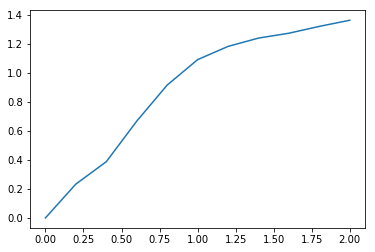

In [227]:
plt.plot(time,rmsd[2])

#### Surfactant head MSD

In [148]:
rmsd = rms_surfactant_head_list[0].rmsd.T   # transpose makes it easier for plotting
time = rmsd[1]

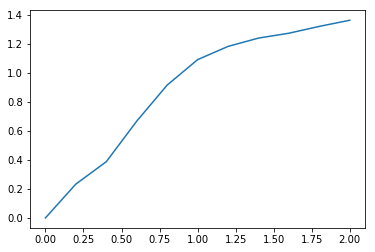

In [149]:
plt.plot(time,rmsd[2])

#### Au-S (substrate - head group ) RDF

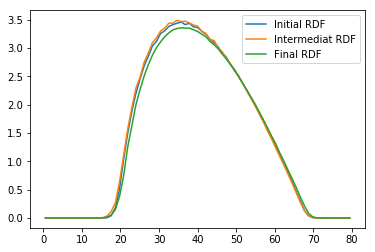

In [151]:
# indicates desired approach towards substrate
plt.plot(bins[0],rdf[0],label="Initial RDF")
plt.plot(bins[3],rdf[4],label="Intermediat RDF")
plt.plot(bins[-1],rdf[-1],label="Final RDF")
plt.legend()


### Pre-evaluated RDF

#### Overview

In [58]:
query = { 
    "metadata.project": project_id,
    "metadata.type": {'$regex': '.*rdf$'},
    "metadata.step": "ParametricBranching:GromacsPull:ProcessAnalyzeAndVisualize:push_filepad",
}

fp.filepad.count_documents(query)

120

In [59]:
# check files degenerate by 'metadata.type' ad 'metadata.name'
aggregation_pipeline = [
    {
        "$match": query
    },
    {  # group by unique project id
        "$group": { 
            "_id": { 
                'type': '$metadata.type',
            },
            "object_count": {"$sum": 1}, # count matching data sets
            "earliest":  {'$min': '$metadata.datetime' },
            "latest":  {'$max': '$metadata.datetime' },
        },
    },
    {  # sort by earliest date, descending
        "$sort": { 
            "earliest": pymongo.DESCENDING,
        }
    }
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

res = [ {**c['_id'], **c} for c in cursor]
columns = ['type', 'earliest', 'latest', 'object_count', '_id']
res_df = pd.DataFrame(data=res, columns=columns) # pandas Dataframe is just nice for printing in notebook
del res_df["_id"]

In [60]:
res_df

,type,earliest,latest,object_count
0,surfactant_tail_surfactant_tail_rdf,2020-07-09 01:30:15.514364,2020-07-09 01:30:16.787582,12
1,surfactant_head_surfactant_tail_rdf,2020-07-09 01:30:15.514361,2020-07-09 01:30:16.787579,12
2,surfactant_head_surfactant_head_rdf,2020-07-09 01:30:15.514359,2020-07-09 01:30:16.787577,12
3,substrate_surfactant_tail_rdf,2020-07-09 01:30:15.514356,2020-07-09 01:30:16.787574,12
4,substrate_surfactant_head_rdf,2020-07-09 01:30:15.514354,2020-07-09 01:30:16.787572,12
5,substrate_substrate_rdf,2020-07-09 01:30:15.514351,2020-07-09 01:30:16.787569,12
6,counterion_surfactant_tail_rdf,2020-07-09 01:30:15.514349,2020-07-09 01:30:16.787567,12
7,counterion_surfactant_head_rdf,2020-07-09 01:30:15.514346,2020-07-09 01:30:16.787565,12
8,counterion_substrate_rdf,2020-07-09 01:30:15.514344,2020-07-09 01:30:16.787562,12
9,counterion_counterion_rdf,2020-07-09 01:30:15.514342,2020-07-09 01:30:16.787560,12


#### Substrate - surfactant head RDF

In [61]:
parameter_dict = {
    'nmolecules': 'metadata.system.surfactant.nmolecules'}

In [62]:
query = { 
    "metadata.project": project_id,
    "metadata.type": 'substrate_surfactant_head_rdf',
    "metadata.step": "ParametricBranching:GromacsPull:ProcessAnalyzeAndVisualize:push_filepad",
}

fp.filepad.count_documents(query)

12

In [63]:
res_dict = {}
failed_list = []

match_aggregation = {
        "$match": query
    }
sort_aggregation = {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    }
group_aggregation = { 
    "$group": { 
        "_id": { field: '${}'.format(key) for field, key in parameter_dict.items() },
        "degeneracy": {"$sum": 1}, # number matching data sets
        "latest":     {"$first": "$gfs_id"} # unique gridfs id of file
    }
}
aggregation_pipeline = [ match_aggregation, sort_aggregation, group_aggregation ]
cursor = fp.filepad.aggregate(aggregation_pipeline)

# res_list = []
for i, c in enumerate(cursor): 
    content, metadata = fp.get_file_by_id(c["latest"])
    nmolecules = int(c["_id"]["nmolecules"])
    data_str = io.StringIO(content.decode())
    data = np.loadtxt(data_str, comments='#')
    d = data[0] # distance bins
    rdf = data[1:]
    res_dict[nmolecules] = {'dist': d, 'rdf': rdf}
    # res_list.append(data)
    print('.',end='')
print('')

............


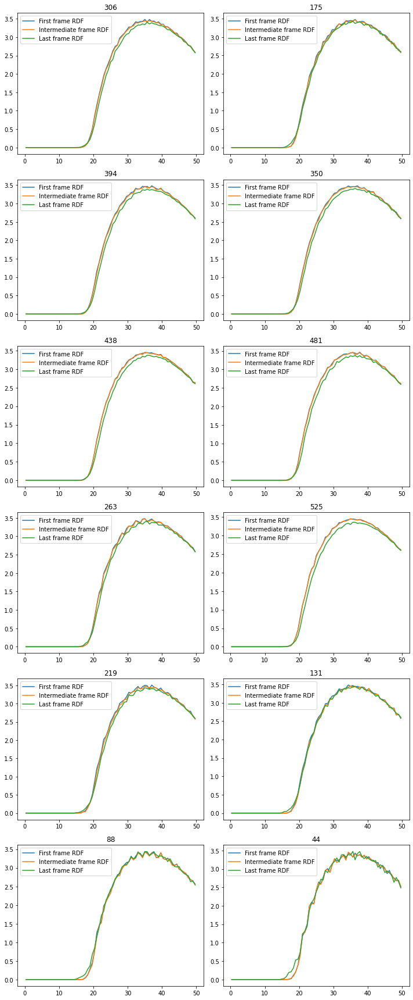

In [64]:
cols = 2
n = len(res_dict)
rows = round(n/cols)
if rows > 1:
    positions = [(i,j) for i in range(rows) for j in range(cols)][:n]
else:
    positions = [i for i in range(cols)][:n]
    
fig, ax = plt.subplots(rows,cols,figsize=(5*cols,4*rows))
# for key, grp in res_df.groupby(['nmolecules']):
for pos, (nmolecules, data) in zip(positions, res_dict.items()):
    ax[pos].plot(data['dist'],data['rdf'][0], label='First frame RDF')
    ax[pos].plot(data['dist'],data['rdf'][len(data)//2],label='Intermediate frame RDF')
    ax[pos].plot(data['dist'],data['rdf'][-1],label='Last frame RDF')
    ax[pos].set_title(nmolecules)
    ax[pos].legend()

fig.tight_layout()
# fig.legend()
fig.show()

#### Substrate - surfactant tail RDF

In [67]:
parameter_dict = {
    'nmolecules': 'metadata.system.surfactant.nmolecules'}

In [68]:
query = { 
    "metadata.project": project_id,
    "metadata.type": 'substrate_surfactant_tail_rdf',
    "metadata.step": "ParametricBranching:GromacsPull:ProcessAnalyzeAndVisualize:push_filepad",
}

fp.filepad.count_documents(query)

12

In [90]:
res_dict = {}
failed_list = []

match_aggregation = {
        "$match": query
    }
sort_aggregation = {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    }
group_aggregation = { 
    "$group": { 
        "_id": { field: '${}'.format(key) for field, key in parameter_dict.items() },
        "degeneracy": {"$sum": 1}, # number matching data sets
        "latest":     {"$first": "$gfs_id"} # unique gridfs id of file
    }
}
second_sort_aggregation = {
    "$sort": { 
        "_id.nmolecules": pymongo.DESCENDING,
    }
}


aggregation_pipeline = [ 
    match_aggregation, sort_aggregation, group_aggregation, second_sort_aggregation ]
cursor = fp.filepad.aggregate(aggregation_pipeline)

# res_list = []
for i, c in enumerate(cursor): 
    content, metadata = fp.get_file_by_id(c["latest"])
    nmolecules = int(c["_id"]["nmolecules"])
    data_str = io.StringIO(content.decode())
    data = np.loadtxt(data_str, comments='#')
    d = data[0] # distance bins
    rdf = data[1:]
    res_dict[nmolecules] = {'dist': d, 'rdf': rdf}
    # res_list.append(data)
    print('.',end='')
print('')

............


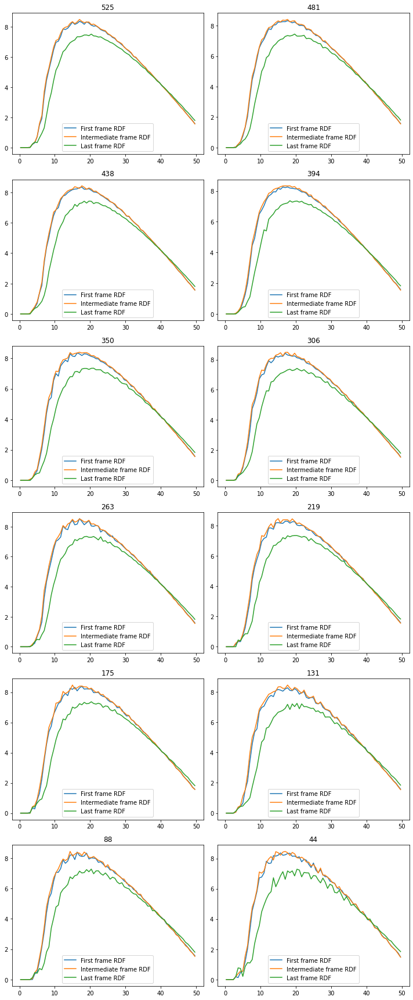

In [92]:
cols = 2
n = len(res_dict)
rows = round(n/cols)
if rows > 1:
    positions = [(i,j) for i in range(rows) for j in range(cols)][:n]
else:
    positions = [i for i in range(cols)][:n]
    
fig, ax = plt.subplots(rows,cols,figsize=(5*cols,4*rows))
# for key, grp in res_df.groupby(['nmolecules']):
for pos, (nmolecules, data) in zip(positions, res_dict.items()):
    ax[pos].plot(data['dist'],data['rdf'][0], label='First frame RDF')
    ax[pos].plot(data['dist'],data['rdf'][len(data)//2],label='Intermediate frame RDF')
    ax[pos].plot(data['dist'],data['rdf'][-1],label='Last frame RDF')
    ax[pos].set_title(nmolecules)
    ax[pos].legend()

fig.tight_layout()
# fig.legend()
fig.show()

#### Surfactant head - surfactant tail RDF

In [95]:
parameter_dict = {
    'nmolecules': 'metadata.system.surfactant.nmolecules'}

In [96]:
query = { 
    "metadata.project": project_id,
    "metadata.type": 'surfactant_head_surfactant_tail_rdf',
    "metadata.step": "ParametricBranching:GromacsPull:ProcessAnalyzeAndVisualize:push_filepad",
}

fp.filepad.count_documents(query)

12

In [97]:
res_dict = {}
failed_list = []

match_aggregation = {
        "$match": query
    }
sort_aggregation = {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    }
group_aggregation = { 
    "$group": { 
        "_id": { field: '${}'.format(key) for field, key in parameter_dict.items() },
        "degeneracy": {"$sum": 1}, # number matching data sets
        "latest":     {"$first": "$gfs_id"} # unique gridfs id of file
    }
}
second_sort_aggregation = {
    "$sort": { 
        "_id.nmolecules": pymongo.DESCENDING,
    }
}


aggregation_pipeline = [ 
    match_aggregation, sort_aggregation, group_aggregation, second_sort_aggregation ]
cursor = fp.filepad.aggregate(aggregation_pipeline)

# res_list = []
for i, c in enumerate(cursor): 
    content, metadata = fp.get_file_by_id(c["latest"])
    nmolecules = int(c["_id"]["nmolecules"])
    data_str = io.StringIO(content.decode())
    data = np.loadtxt(data_str, comments='#')
    d = data[0] # distance bins
    rdf = data[1:]
    res_dict[nmolecules] = {'dist': d, 'rdf': rdf}
    # res_list.append(data)
    print('.',end='')
print('')

............


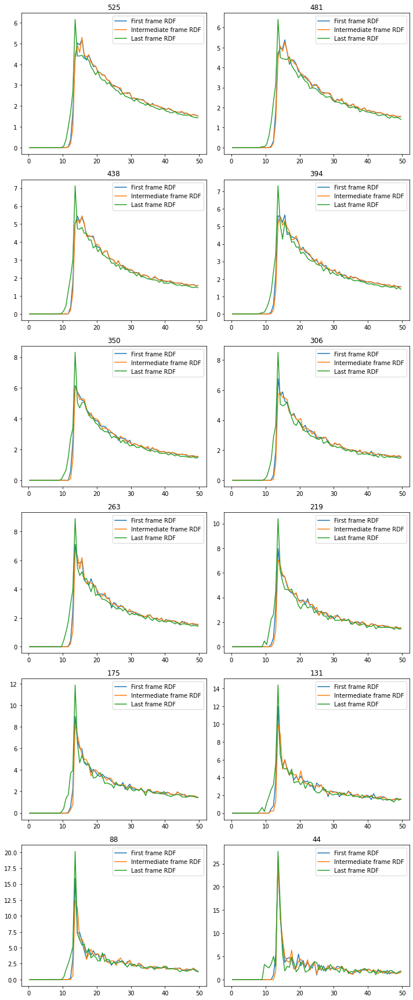

In [98]:
cols = 2
n = len(res_dict)
rows = round(n/cols)
if rows > 1:
    positions = [(i,j) for i in range(rows) for j in range(cols)][:n]
else:
    positions = [i for i in range(cols)][:n]
    
fig, ax = plt.subplots(rows,cols,figsize=(5*cols,4*rows))
# for key, grp in res_df.groupby(['nmolecules']):
for pos, (nmolecules, data) in zip(positions, res_dict.items()):
    ax[pos].plot(data['dist'],data['rdf'][0], label='First frame RDF')
    ax[pos].plot(data['dist'],data['rdf'][len(data)//2],label='Intermediate frame RDF')
    ax[pos].plot(data['dist'],data['rdf'][-1],label='Last frame RDF')
    ax[pos].set_title(nmolecules)
    ax[pos].legend()

fig.tight_layout()
# fig.legend()
fig.show()

## Energy minimization after solvation analysis

### Overview on objects in step

In [18]:
# queries to the data base are simple dictionaries
query = {
    'metadata.project': project_id,
    'metadata.step': 'ParametricBranching:GromacsEnergyMinimizationAfterSolvation:ProcessAnalyzeAndVisualize:push_filepad'
}

In [19]:
# use underlying MongoDB functionality to check total number of documents matching query
fp.filepad.count_documents(query)

240

In [20]:
# check files degenerate by 'metadata.type' ad 'metadata.name'
aggregation_pipeline = [
    {
        "$match": query
    },
    {  # group by unique project id
        "$group": { 
            "_id": { 
                'type': '$metadata.type',
                'name': '$metadata.name',
            },
            "object_count": {"$sum": 1}, # count matching data sets
            "earliest":  {'$min': '$metadata.datetime' },
            "latest":  {'$max': '$metadata.datetime' },
        },
    },
    {  # sort by earliest date, descending
        "$sort": { 
            "earliest": pymongo.DESCENDING,
        }
    }
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

res = [ {**c['_id'], **c} for c in cursor]
columns = ['type', 'name', 'earliest', 'latest', 'object_count', '_id']
res_df = pd.DataFrame(data=res, columns=columns) # pandas Dataframe is just nice for printing in notebook
del res_df["_id"]

In [21]:
res_df

,type,name,earliest,latest,object_count
0,mp4_file,NaN,2020-07-09 01:30:15.524564,2020-07-09 01:30:16.798142,12
1,surfactant_tail_rmsd,NaN,2020-07-09 01:30:15.524562,2020-07-09 01:30:16.798140,12
2,surfactant_head_rmsd,NaN,2020-07-09 01:30:15.524559,2020-07-09 01:30:16.798137,12
3,substrate_rmsd,NaN,2020-07-09 01:30:15.524556,2020-07-09 01:30:16.798135,12
4,counterion_rmsd,NaN,2020-07-09 01:30:15.524554,2020-07-09 01:30:16.798132,12
5,surfactant_tail_surfactant_tail_rdf,NaN,2020-07-09 01:30:15.524552,2020-07-09 01:30:16.798130,12
6,surfactant_head_surfactant_tail_rdf,NaN,2020-07-09 01:30:15.524549,2020-07-09 01:30:16.798127,12
7,surfactant_head_surfactant_head_rdf,NaN,2020-07-09 01:30:15.524547,2020-07-09 01:30:16.798125,12
8,substrate_surfactant_tail_rdf,NaN,2020-07-09 01:30:15.524544,2020-07-09 01:30:16.798123,12
9,substrate_surfactant_head_rdf,NaN,2020-07-09 01:30:15.524542,2020-07-09 01:30:16.798120,12


### Global observables

In [22]:
query = { 
    "metadata.project": project_id,
    'metadata.step': 'ParametricBranching:GromacsEnergyMinimizationAfterSolvation:ProcessAnalyzeAndVisualize:push_filepad',  #{'$regex': 'GromacsEnergyMinimization'}
    "metadata.type": 'energy_file',
}
fp.filepad.count_documents(query)

12

In [23]:
parameter_dict = {'nmolecules': 'metadata.system.surfactant.nmolecules'}

In [24]:
aggregation_pipeline = [
    {
        "$match": query
    },
    {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    },
    { 
        "$group": { 
            "_id": { field: '${}'.format(key) for field, key in parameter_dict.items() },
            "degeneracy": {"$sum": 1}, # number matching data sets
            "latest":     {"$first": "$gfs_id"} # unique gridfs id of file
        }
    },
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

In [25]:
res_mi_list = []

aggregation_pipeline = [
    {
        "$match": query
    },
    {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    },
    { 
        "$group": { 
            "_id": { field: '${}'.format(key) for field, key in parameter_dict.items() },
            "degeneracy": {"$sum": 1}, # number matching data sets
            "latest":     {"$first": "$gfs_id"} # unique gridfs id of file
        }
    },
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

for i, c in enumerate(cursor): 
    content, metadata = fp.get_file_by_id(c["latest"])
    with tempfile.NamedTemporaryFile(suffix='.edr') as tmp:
        tmp.write(content)
        em_df = panedr.edr_to_df(tmp.name)
        
        mi = pd.MultiIndex.from_product(
            [c["_id"].values(),em_df.index],
            names=[*c["_id"].keys(),'step'])
        em_mi_df = em_df.set_index(mi)        
        res_mi_list.append(em_mi_df)
    print('.',end='')
print('')

res_mi_df = pd.concat(res_mi_list)
res_df = res_mi_df.reset_index()

............


In [26]:
res_mi_df

Time        Bond           U-B   Proper Dih.  \
nmolecules step                                                       
525        0.0          0.0  161.804901  43983.476562  15446.817383   
           1.0          1.0  161.778137  43983.011719  15446.825195   
           2.0          2.0  161.758942  43982.449219  15446.833008   
           3.0          3.0  161.752808  43981.742188  15446.843750   
           4.0          4.0  161.778061  43980.878906  15446.851562   
...                     ...         ...           ...           ...   
219        9995.0    9995.0  261.282990  16753.611328   5973.765137   
           9996.0    9996.0  263.644775  16757.851562   5973.758301   
           9998.0    9998.0  256.603333  16754.261719   5973.758301   
           9999.0    9999.0  266.869904  16759.068359   5973.746582   
           10000.0  10000.0  257.433350  16753.835938   5973.747559   

                          LJ-14     Coulomb-14        LJ (SR)  Coulomb (SR)  \
nmolecules step                                                               
525        0.0      3762.690674  135706.421875  958655.812500   -3724685.75   
           1.0      3762.915039  135706.828125  956965.562500   -3724699.25   
           2.0      3763.183350  135707.296875  954930.562500   -3724715.75   
           3.0      3763.515381  135707.890625  952477.187500   -3724736.25   
           4.0      3763.920898  135708.625000  949522.125000   -3724761.00   
...                         ...            ...            ...           ...   
219        9995.0   1430.592163   56566.898438 -110296.773438   -4553745.00   
           9996.0   1431.567261   56567.769531 -110295.820312   -4553756.50   
           9998.0   1430.978394   56567.246094 -110294.570312   -4553755.50   
           9999.0   1431.640015   56567.847656 -110289.031250   -4553779.00   
           10000.0  1430.834473   56567.125000 -110287.750000   -4553777.00   

                    Coul. recip.  Position Rest.  ...    Pres-XY    Pres-XZ  \
nmolecules step                                   ...                         
525        0.0      40462.300781        0.262039  ...  56.934471  72.266235   
           1.0      40462.062500        0.262045  ...  56.815948  72.130508   
           2.0      40461.687500        0.262154  ...  56.673618  71.968033   
           3.0      40461.351562        0.262432  ...  56.502007  71.772667   
           4.0      40460.863281        0.262990  ...  56.294838  71.538246   
...                          ...             ...  ...        ...        ...   
219        9995.0    5788.273438     2115.128174  ...   2.728610  13.643753   
           9996.0    5787.473145     2115.128662  ...   2.728566  13.644175   
           9998.0    5787.886719     2115.116943  ...   2.728557  13.644362   
           9999.0    5787.276367     2115.112793  ...   2.728649  13.645870   
           10000.0   5787.891113     2115.098877  ...   2.728636  13.646180   

                      Pres-YX     Pres-YY    Pres-YZ    Pres-ZX    Pres-ZY  \
nmolecules step                                                              
525        0.0      56.934483 -273.142059 -24.399984  72.266251 -24.399986   
           1.0      56.815948 -273.195740 -24.467348  72.130516 -24.467337   
           2.0      56.673630 -273.259247 -24.548172  71.968018 -24.548176   
           3.0      56.501995 -273.335602 -24.643551  71.772652 -24.643547   
           4.0      56.294838 -273.426453 -24.755783  71.538223 -24.755787   
...                       ...         ...        ...        ...        ...   
219        9995.0    2.728613 -396.830353  -8.665934  13.643753  -8.665941   
           9996.0    2.728566 -396.830719  -8.666225  13.644176  -8.666223   
           9998.0    2.728555 -396.830872  -8.666327  13.644370  -8.666327   
           9999.0    2.728647 -396.833008  -8.667096  13.645872  -8.667089   
           10000.0   2.728632 -396.833466  -8.667222  13.646176  -8.667225   

                       Pres-

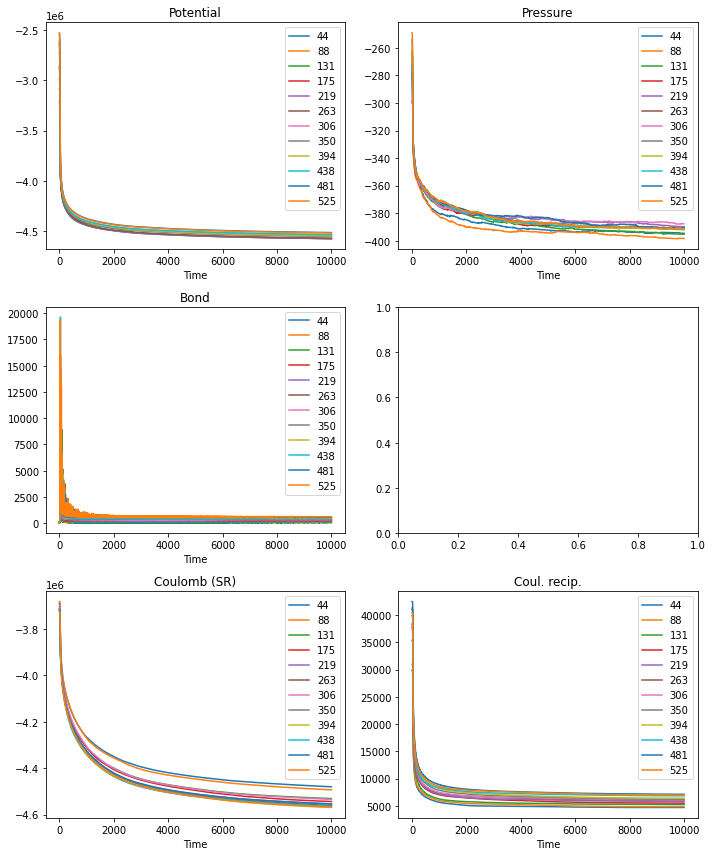

In [27]:
y_quantities = [
    'Potential',
    'Pressure',
    'Bond',
    'Coulomb (SR)',
    'Coul. recip.',
    ]

positions = [
    (0,0),
    (0,1),
    (1,0),
    (2,0),
    (2,1),
]
fig, ax = plt.subplots(3,2,figsize=(10,12))
for key, grp in res_df.groupby(['nmolecules']):
    for y_quantity, position in zip(y_quantities, positions):
        grp.plot('Time',y_quantity,ax=ax[position],label=key,title=y_quantity)
        
fig.tight_layout()

###  Rendered videos

In [30]:
query = {
    'metadata.project': project_id,
    'metadata.step': 'ParametricBranching:GromacsEnergyMinimizationAfterSolvation:ProcessAnalyzeAndVisualize:push_filepad',
    'metadata.type': 'mp4_file',
}

In [31]:
# use underlying MongoDB functionality to check total number of documents matching query
fp.filepad.count_documents(query)

12

In [32]:
# check

aggregation_pipeline = [
    {
        "$match": query
    },
    {  # group by unique project id
        "$group": { 
            "_id": { 
                'nmolecules': '$metadata.system.surfactant.nmolecules'
            },
            "object_count": {"$sum": 1}, # count matching data sets
            "earliest":  {'$min': '$metadata.datetime' },
            "latest":  {'$max': '$metadata.datetime' },
        },
    },
    {  # sort by earliest date, descending
        "$sort": { 
            "earliest": pymongo.DESCENDING,
        }
    }
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

# for i, c in enumerate(cursor): 
#    content, metadata = fp.get_file_by_id(c["latest"])
#    nmolecules = int(c["_id"]["nmolecules"])
    

res = [ {**c['_id'], **c} for c in cursor]
columns = ['nmolecules', 'name', 'earliest', 'latest', 'object_count', '_id']
res_df = pd.DataFrame(data=res, columns=columns) # pandas Dataframe is just nice for printing in notebook
del res_df["_id"]

In [33]:
res_df

,nmolecules,name,earliest,latest,object_count
0,525,NaN,2020-07-09 01:30:16.798142,2020-07-09 01:30:16.798142,1
1,481,NaN,2020-07-09 01:30:16.697143,2020-07-09 01:30:16.697143,1
2,438,NaN,2020-07-09 01:30:16.585689,2020-07-09 01:30:16.585689,1
3,394,NaN,2020-07-09 01:30:16.375198,2020-07-09 01:30:16.375198,1
4,350,NaN,2020-07-09 01:30:16.288551,2020-07-09 01:30:16.288551,1
5,306,NaN,2020-07-09 01:30:16.201223,2020-07-09 01:30:16.201223,1
6,263,NaN,2020-07-09 01:30:16.116890,2020-07-09 01:30:16.116890,1
7,219,NaN,2020-07-09 01:30:16.024390,2020-07-09 01:30:16.024390,1
8,175,NaN,2020-07-09 01:30:15.907847,2020-07-09 01:30:15.907847,1
9,131,NaN,2020-07-09 01:30:15.792477,2020-07-09 01:30:15.792477,1


In [34]:
aggregation_pipeline = [
    {
        "$match": query
    },
    {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    },
    { 
        "$group": { 
            "_id": { field: '${}'.format(key) for field, key in parameter_dict.items() },
            "degeneracy": {"$sum": 1}, # number matching data sets
            "latest":     {"$first": "$gfs_id"} # unique gridfs id of file
        }
    },
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

obj_dict = {}
for i, c in enumerate(cursor): 
    content, metadata = fp.get_file_by_id(c["latest"])
    # print(metadata['metadata'])
    with tempfile.NamedTemporaryFile(suffix='.mp4',delete=False) as tmp:
        tmp.write(content)
        # obj_list.append(Video(filename=tmp.name)) 
        # obj_list.append(tmp.name)
        obj_dict.update({metadata['metadata']['system']['surfactant']['nmolecules']: Video.from_file(tmp.name)})
    print('.',end='')

............

In [35]:
for key, obj in obj_dict.items():
    print(key)
    display(obj)

525


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x05\xadWmdat\x00\x…

394


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x06\x08\xadmdat\x0…

438


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x05\xb4\xffmdat\x0…

350


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x05\xf9Fmdat\x00\x…

263


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x06=\xd8mdat\x00\x…

175


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x06pZmdat\x00\x00\…

131


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x05\xde\x15mdat\x0…

44


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x03\xe5\xf7mdat\x0…

306


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x06;pmdat\x00\x00\…

88


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x05F]mdat\x00\x00\…

481


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x05\xd5\x19mdat\x0…

219


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x06\x8c}mdat\x00\x…

### Trajectory

In [243]:
query = { 
    "metadata.project": project_id,
    'metadata.step': 'GromacsEnergyMinimizationAfterSolvation:ProcessAnalyzeAndVisualize:push_filepad',
    "metadata.type":    { '$in': ['trajectory_file','data_file'] },
}
fp.filepad.count_documents(query)

2

In [244]:
# Building a rather sophisticated aggregation pipeline

# first group by nmolecules and type ...

parameter_dict = {
    'nmolecules': 'metadata.system.surfactant.nmolecules',
    'type': 'metadata.type'}
# parameter_names = ['nmolecules', 'type']

query = { 
    "metadata.project": project_id,
    "metadata.type":    { '$in': ['trajectory_file','data_file'] },
}

aggregation_pipeline = []

aggregation_pipeline.append({ 
    "$match": query
})

aggregation_pipeline.append({ 
    "$sort": { 
        "metadata.system.surfactant.nmolecules": pymongo.ASCENDING,
        "metadata.datetime": pymongo.DESCENDING,
    }
})

aggregation_pipeline.append({ 
    "$group": { 
        "_id": { field: '${}'.format(key) for field, key in parameter_dict.items() },
        "degeneracy": {"$sum": 1}, # number matching data sets
        "latest":     {"$first": "$gfs_id"} # unique gridfs id of file
    }
})

# second group by nmolecules

parameter_dict = {
    'nmolecules': 'metadata.system.surfactant.nmolecules'}

aggregation_pipeline.append({ 
    "$group": { 
        "_id": { field: '$_id.{}'.format(field) for field in parameter_dict.keys() },
        "type":     {"$addToSet": "$_id.type"},
        "gfs_id":   {"$addToSet": "$latest"} 
        #"$_id.type": "$latest"
    }
})

aggregation_pipeline.append({
    '$project': {
         '_id': False,
        **{field: '$_id.{}'.format(field) for field in parameter_dict.keys()},
        'objects': { 
            '$zip': {
                'inputs': [ '$type', '$gfs_id' ],
                'useLongestLength': True,
                'defaults':  [None,None]
            }
        }
    }
})

aggregation_pipeline.append({ 
    '$project': {
        **{p: True for p in parameter_dict.keys()},
        'objects': {'$arrayToObject': '$objects'}
        #'objects': False 
    }
})

aggregation_pipeline.append({ 
    '$addFields': {
        'objects': {**{ field: '${}'.format(field) for field in parameter_dict.keys()}}
    }
})

aggregation_pipeline.append({ 
    '$replaceRoot': { 'newRoot': '$objects' }
})

# display results with
# for i, c in enumerate(cursor): 
#    print(c)
# yields documents in the form
# {'em_solvated_gro': '5e6a4e3d6c26f976ceae5e38', 'em_solvated_trr': '5e6a4e3a6c26f976ceae5e14', 'nmolecules': '44'}
# i.e. most recent topology file and trajectory file per concentration

cursor = fp.filepad.aggregate(aggregation_pipeline)

mda_trr_list = []
for i, c in enumerate(cursor): 
    em_gro_content, _ = fp.get_file_by_id(c["data_file"])
    em_trr_content, _ = fp.get_file_by_id(c["trajectory_file"])
    # Stream approach won't work
    # with io.TextIOWrapper( io.BytesIO(em_gro_content) ) as gro, \
    #    io.BytesIO(em_trr_content) as trr:   
        #mda_trr_list.append( 
        #    mda.Universe( 
        #        gro,trr, topology_format = 'GRO', format='TRR') )
    with tempfile.NamedTemporaryFile(suffix='.gro') as gro, \
        tempfile.NamedTemporaryFile(suffix='.trr') as trr:
        gro.write(em_gro_content)
        trr.write(em_trr_content)
        mda_trr_list.append( mda.Universe(gro.name,trr.name) )
    print('.',end='')
print('')

.


In [245]:
mda_trr = mda_trr_list[0]
# check unique resiude names in system
resnames = np.unique([ r.resname for r in mda_trr.residues ])

In [246]:
resnames

array(['AUM', 'NA', 'SDS', 'SOL'], dtype='<U3')

In [247]:
mda_view = nglview.show_mdanalysis(mda_trr)

# setSize: https://cloud.githubusercontent.com/assets/22888066/21761120/e47e2988-d68b-11e6-9e11-a894d7833d50.png
mda_view._remote_call('setSize', target='Widget', args=['600px','600px'])

mda_view.clear_representations()
mda_view.background = 'white'
mda_view.add_representation(repr_type='ball+stick',selection='SDS')
mda_view.add_representation(repr_type='ball+stick',selection='NA')
mda_view.add_representation(repr_type='spacefill',selection='AUM',color='yellow')
mda_view.center()
mda_view

NGLWidget(max_frame=100)

#### Render images

In [248]:
len(mda_trr.trajectory)

101

In [68]:
# https://ambermd.org/tutorials/analysis/tutorial_notebooks/nglview_movie/index.html
    
# make sure to change your web browser option to save files as default (vs open file by external program)
# NGLView will render each snapshot and save image to your web browser default download location
# uncomment all the commands below to render

from time import sleep

# # to save time for this tutorial, we make a movie with only 50 frames
for frame in range(0, len(mda_trr.trajectory)):
     # set frame to update coordinates
    mda_view.frame = frame
    # make sure to let NGL spending enough time to update coordinates
    sleep(0.5)
    mda_view.download_image(filename='frame{:04d}.png'.format(frame))
    # make sure to let NGL spending enough time to render before going to next frame
    sleep(2.0)

In [ ]:
# ffmpeg -r 20 -f image2 -i frame%04d.png -vcodec libx264 -crf 25 -pix_fmt yuv420p out.mp4

#### Render gif

In [44]:
from nglview.contrib.movie import MovieMaker

In [50]:
output_folder = os.path.join(work_prefix,'mov')

In [52]:
try:
    os.mkdir(output_folder)
except FileExistsError as exc:
    print(exc)

In [64]:
mov = MovieMaker(
    mda_view, download_folder=output_folder, output="em_solvated.gif")

In [65]:
mov.make()

IntProgress(value=0, description='Rendering ...', max=79)

#### Make avi

In [66]:
# write avi format
from nglview.contrib.movie import MovieMaker
moviepy_params = {
     'codec': 'mpeg4'
}
movie = MovieMaker(mda_view, output='em_solvated.avi', in_memory=True, moviepy_params=moviepy_params)
movie.make()

IntProgress(value=0, description='Rendering ...', max=79)

Again, relax the system a little with positional constraints applied to all ions.

## NVT equilibration analysis

### Overview on objects in step

In [36]:
# queries to the data base are simple dictionaries
query = {
    'metadata.project': project_id,
    'metadata.step': 'ParametricBranching:GromacsNVTEquilibration:ProcessAnalyzeAndVisualize:push_filepad'
}

In [37]:
# use underlying MongoDB functionality to check total number of documents matching query
fp.filepad.count_documents(query)

252

In [38]:
# check files degenerate by 'metadata.type' ad 'metadata.name'
aggregation_pipeline = [
    {
        "$match": query
    },
    {  # group by unique project id
        "$group": { 
            "_id": { 
                'type': '$metadata.type',
                'name': '$metadata.name',
            },
            "object_count": {"$sum": 1}, # count matching data sets
            "earliest":  {'$min': '$metadata.datetime' },
            "latest":  {'$max': '$metadata.datetime' },
        },
    },
    {  # sort by earliest date, descending
        "$sort": { 
            "earliest": pymongo.DESCENDING,
        }
    }
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

res = [ {**c['_id'], **c} for c in cursor]
columns = ['type', 'name', 'earliest', 'latest', 'object_count', '_id']
res_df = pd.DataFrame(data=res, columns=columns) # pandas Dataframe is just nice for printing in notebook
del res_df["_id"]

In [39]:
res_df

,type,name,earliest,latest,object_count
0,mp4_file,NaN,2020-07-09 01:30:15.549197,2020-07-09 01:30:16.808797,12
1,surfactant_tail_rmsd,NaN,2020-07-09 01:30:15.549193,2020-07-09 01:30:16.808794,12
2,surfactant_head_rmsd,NaN,2020-07-09 01:30:15.549190,2020-07-09 01:30:16.808792,12
3,substrate_rmsd,NaN,2020-07-09 01:30:15.549187,2020-07-09 01:30:16.808789,12
4,counterion_rmsd,NaN,2020-07-09 01:30:15.549184,2020-07-09 01:30:16.808787,12
5,surfactant_tail_surfactant_tail_rdf,NaN,2020-07-09 01:30:15.549181,2020-07-09 01:30:16.808784,12
6,surfactant_head_surfactant_tail_rdf,NaN,2020-07-09 01:30:15.549178,2020-07-09 01:30:16.808782,12
7,surfactant_head_surfactant_head_rdf,NaN,2020-07-09 01:30:15.549175,2020-07-09 01:30:16.808780,12
8,substrate_surfactant_tail_rdf,NaN,2020-07-09 01:30:15.549172,2020-07-09 01:30:16.808777,12
9,substrate_surfactant_head_rdf,NaN,2020-07-09 01:30:15.549169,2020-07-09 01:30:16.808775,12


### Global observables

In [41]:
query = { 
    "metadata.project": project_id,
    'metadata.step': 'ParametricBranching:GromacsNVTEquilibration:ProcessAnalyzeAndVisualize:push_filepad',
    "metadata.type":    'energy_file',
}
fp.filepad.count_documents(query)

12

In [42]:
parameter_dict = {'nmolecules': 'metadata.system.surfactant.nmolecules'}

In [43]:
aggregation_pipeline = [
    {
        "$match": query
    },
    {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    },
    { 
        "$group": { 
            "_id": { field: '${}'.format(key) for field, key in parameter_dict.items() },
            "degeneracy": {"$sum": 1}, # number matching data sets
            "latest":     {"$first": "$gfs_id"} # unique gridfs id of file
        }
    },
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

In [44]:
[ c for c in cursor]

[{'_id': {'nmolecules': 44},
  'degeneracy': 1,
  'latest': '5f06a4727dc9cfbf449b454c'},
 {'_id': {'nmolecules': 394},
  'degeneracy': 1,
  'latest': '5f0675437dc9cfbf449a27e8'},
 {'_id': {'nmolecules': 350},
  'degeneracy': 1,
  'latest': '5f0681007dc9cfbf449a6fed'},
 {'_id': {'nmolecules': 438},
  'degeneracy': 1,
  'latest': '5f06733a7dc9cfbf449a1a5f'},
 {'_id': {'nmolecules': 263},
  'degeneracy': 1,
  'latest': '5f068e847dc9cfbf449aad05'},
 {'_id': {'nmolecules': 175},
  'degeneracy': 1,
  'latest': '5f0696ee7dc9cfbf449af9c9'},
 {'_id': {'nmolecules': 481},
  'degeneracy': 1,
  'latest': '5f06728e7dc9cfbf449a0db0'},
 {'_id': {'nmolecules': 219},
  'degeneracy': 1,
  'latest': '5f068fb07dc9cfbf449ac64e'},
 {'_id': {'nmolecules': 525},
  'degeneracy': 1,
  'latest': '5f0670de7dc9cfbf449a00f8'},
 {'_id': {'nmolecules': 131},
  'degeneracy': 1,
  'latest': '5f0697ed7dc9cfbf449b0662'},
 {'_id': {'nmolecules': 88},
  'degeneracy': 1,
  'latest': '5f069f8f7dc9cfbf449b38e6'},
 {'_id': {'n

In [45]:
res_list = []

aggregation_pipeline = [
    {
        "$match": query
    },
    {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    },
    { 
        "$group": { 
            "_id": { field: '${}'.format(key) for field, key in parameter_dict.items() },
            "degeneracy": {"$sum": 1}, # number matching data sets
            "latest":     {"$first": "$gfs_id"} # unique gridfs id of file
        }
    },
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

for i, c in enumerate(cursor): 
    content, metadata = fp.get_file_by_id(c["latest"])
    with tempfile.NamedTemporaryFile(suffix='.edr') as tmp:
        tmp.write(content)
        res_df = panedr.edr_to_df(tmp.name)
        
        mi = pd.MultiIndex.from_product(
            [c["_id"].values(),res_df.index],
            names=[*c["_id"].keys(),'step'])
        res_mi_df = res_df.set_index(mi)
        res_list.append(res_mi_df)
    print('.',end='')
print('')
res_df_mi = pd.concat(res_list)
res_df = res_df_mi.reset_index()

............


In [46]:
res_df.columns

Index(['nmolecules', 'step', 'Time', 'Bond', 'U-B', 'Proper Dih.', 'LJ-14',
       'Coulomb-14', 'LJ (SR)', 'Coulomb (SR)', 'Coul. recip.', 'Potential',
       'Kinetic En.', 'Total Energy', 'Conserved En.', 'Temperature',
       'Pressure', 'Constr. rmsd', 'Vir-XX', 'Vir-XY', 'Vir-XZ', 'Vir-YX',
       'Vir-YY', 'Vir-YZ', 'Vir-ZX', 'Vir-ZY', 'Vir-ZZ', 'Pres-XX', 'Pres-XY',
       'Pres-XZ', 'Pres-YX', 'Pres-YY', 'Pres-YZ', 'Pres-ZX', 'Pres-ZY',
       'Pres-ZZ', '#Surf*SurfTen', 'T-non-Substrate', 'T-Substrate',
       'Lamb-non-Substrate', 'Lamb-Substrate'],
      dtype='object')

In [47]:
res_df_mi

Time         Bond           U-B  Proper Dih.        LJ-14  \
nmolecules step                                                                
88         0.0      0.0   131.851639   6730.247559  2331.482422   563.887268   
           1.0      1.0  1162.473389  11973.799805  3137.247070   828.917114   
           2.0      2.0  1367.311646  12871.199219  3307.925781   840.347046   
           3.0      3.0  1506.104248  13498.419922  3386.662109   863.888062   
           4.0      4.0  1578.914062  13755.295898  3405.137451   981.144836   
...                 ...          ...           ...          ...          ...   
131        96.0    96.0  2275.751221  20615.474609  5111.305176  1220.233032   
           97.0    97.0  2320.255127  20566.779297  5227.749512  1334.061279   
           98.0    98.0  2226.532471  20639.490234  5193.020996  1322.358398   
           99.0    99.0  2347.639648  20508.808594  5255.947754  1347.232422   
           100.0  100.0  2264.749756  21071.445312  5265.748047  1268.623535   

                    Coulomb-14        LJ (SR)  Coulomb (SR)  Coul. recip.  \
nmolecules step                                                             
88         0.0    22769.750000  -90148.273438   -4492901.50   4877.040039   
           1.0    22561.390625 -158159.500000   -4016967.75   7517.374023   
           2.0    22467.876953 -180193.906250   -3907587.00   8363.152344   
           3.0    22389.306641 -201827.812500   -3819601.50   9039.631836   
           4.0    22575.958984 -218306.187500   -3755306.25   9326.000977   
...                        ...            ...           ...           ...   
131        96.0   32238.833984 -265550.625000   -3621643.75  10956.721680   
           97.0   32228.570312 -263319.656250   -3623626.50  10830.979492   
           98.0   32075.978516 -260981.781250   -3627749.25  10922.756836   
           99.0   32205.826172 -261680.937500   -3626631.00  10918.868164   
           100.0  32162.523438 -260976.312500   -3627749.00  10772.904297   

                   Potential  ...      Pres-YY     Pres-YZ    Pres-ZX  \
nmolecules step               ...                                       
88         0.0   -4545645.50  ...  -569.832947  149.611359  52.919952   
           1.0   -4127946.00  ...  1440.258789    8.070938 -94.850601   
           2.0   -4038563.00  ...  1919.452881  -15.313110 -78.789360   
           3.0   -3970745.25  ...  2053.746094   17.369396  -8.322670   
           4.0   -3921990.00  ...  2065.312500   85.177956 -14.530103   
...                      ...  ...          ...         ...        ...   
131        96.0  -3814776.00  ...  2340.132568  -36.568039  -6.411274   
           97.0  -3814437.75  ...  2268.215820   72.517715 -19.330690   
           98.0  -3816351.00  ...  2449.972412  -16.837786 -18.271149   
           99.0  -3815727.50  ...  2467.057373   92.324211   7.327162   
           100.0 -3815919.25  ...  2418.405029    3.469247  25.110744   

                     Pres-ZY      Pres-ZZ  #Surf*SurfTen  T-non-Substrate  \
nmolecules step                                                             
88         0.0    148.824631   212.112366    6601.140625       298.622192   
           1.0      9.854258  1540.382324     778.841431       205.794357   
           2.0    -14.358397  1850.456299    -651.079895       236.390549   
           3.0     17.652386  1992.019531    -628.092163       253.358810   
           4.0     85.717766  2235.899902    1905.061157       265.853516   
...                      ...          ...            ...              ...   
131        96.0   -35.111465  2234.196533   -1246.248047       298.351807   
           97.0    73.329025  2445.256836    1180.723755       297.676331   
           98.0   -17.778309  2501.166016    1467.692139       298.807434   
           99.0    92.179932  2457.091064     399.910370       298.549377   
           100.0    3.525263  2396.902588     -30.178104       298.543121   

                  T-Subs

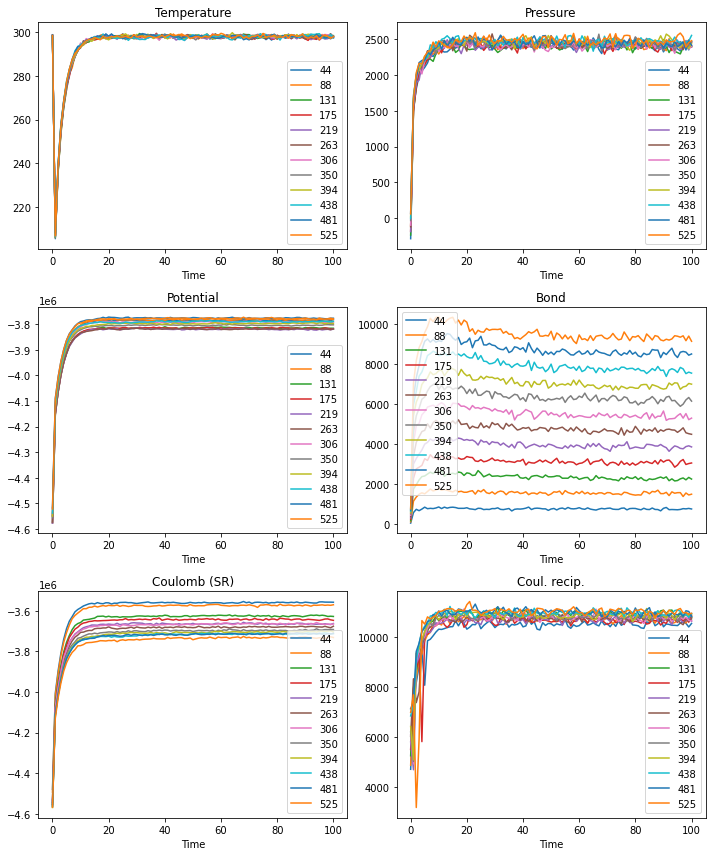

In [48]:
#n = len(res_df['nmolecules'].unique())
y_quantities = [
    'Temperature',
    'Pressure',
    'Potential',
    'Bond',
    'Coulomb (SR)',
    'Coul. recip.',
    ]

n = len(y_quantities)
cols = 2
rows = round(n/cols)
if rows > 1:
    positions = [(i,j) for i in range(rows) for j in range(cols)][:n]
else:
    positions = [i for i in range(cols)][:n]
    
fig, ax = plt.subplots(rows,cols,figsize=(5*cols,4*rows))
for key, grp in res_df.groupby(['nmolecules']):
    for y_quantity, position in zip(y_quantities, positions):
        grp.plot('Time',y_quantity,ax=ax[position],label=key,title=y_quantity)
        
fig.tight_layout()

### Visualize trajectory

In [49]:
query = {
    'metadata.project': project_id,
    'metadata.step': 'ParametricBranching:GromacsNVTEquilibration:ProcessAnalyzeAndVisualize:push_filepad',
    'metadata.type': 'mp4_file',
}

In [50]:
# use underlying MongoDB functionality to check total number of documents matching query
fp.filepad.count_documents(query)

12

In [51]:
parameter_dict = {'nmolecules': 'metadata.system.surfactant.nmolecules'}

aggregation_pipeline = [
    {
        "$match": query
    },
    {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    },
    { 
        "$group": { 
            "_id": { field: '${}'.format(key) for field, key in parameter_dict.items() },
            "degeneracy": {"$sum": 1}, # number matching data sets
            "latest":     {"$first": "$gfs_id"} # unique gridfs id of file
        }
    },
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

obj_dict = {}
for i, c in enumerate(cursor): 
    content, metadata = fp.get_file_by_id(c["latest"])
    # print(metadata['metadata'])
    with tempfile.NamedTemporaryFile(suffix='.mp4',delete=False) as tmp:
        tmp.write(content)
        # obj_list.append(Video(filename=tmp.name)) 
        # obj_list.append(tmp.name)
        key = tuple(c["_id"].values())
        obj_dict.update({key: Video.from_file(tmp.name)})
    print('.',end='')

............

In [52]:
for key, obj in obj_dict.items():
    print(key)
    display(obj)

(525,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00*\x14\nmdat\x00\x00…

(394,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\'\xb0\xeemdat\x00\…

(438,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00(\x1c\xbbmdat\x00\x…

(350,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00&(\x1dmdat\x00\x00\…

(263,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00#\xd1\x15mdat\x00\x…

(175,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00 4\xa8mdat\x00\x00\…

(131,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x1a\x95\xc3mdat\x0…

(44,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\r\x9d8mdat\x00\x00…

(306,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00#5Omdat\x00\x00\x02…

(88,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x14\xe1\xa5mdat\x0…

(481,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00(\xc4\x82mdat\x00\x…

(219,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00!\xd8\nmdat\x00\x00…

## NPT equilibration analysis

### Overview on objects in step

In [54]:
# queries to the data base are simple dictionaries
query = {
    'metadata.project': project_id,
    'metadata.step': 'ParametricBranching:GromacsNPTEquilibration:ProcessAnalyzeAndVisualize:push_filepad'
}

In [55]:
# use underlying MongoDB functionality to check total number of documents matching query
fp.filepad.count_documents(query)

252

In [56]:
# check files degenerate by 'metadata.type' ad 'metadata.name'
aggregation_pipeline = [
    {
        "$match": query
    },
    {  # group by unique project id
        "$group": { 
            "_id": { 
                'type': '$metadata.type',
                'name': '$metadata.name',
            },
            "object_count": {"$sum": 1}, # count matching data sets
            "earliest":  {'$min': '$metadata.datetime' },
            "latest":  {'$max': '$metadata.datetime' },
        },
    },
    {  # sort by earliest date, descending
        "$sort": { 
            "earliest": pymongo.DESCENDING,
        }
    }
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

res = [ {**c['_id'], **c} for c in cursor]
columns = ['type', 'name', 'earliest', 'latest', 'object_count', '_id']
res_df = pd.DataFrame(data=res, columns=columns) # pandas Dataframe is just nice for printing in notebook
del res_df["_id"]

In [57]:
res_df

,type,name,earliest,latest,object_count
0,mp4_file,NaN,2020-07-09 01:30:15.581056,2020-07-09 01:30:16.819138,12
1,surfactant_tail_rmsd,NaN,2020-07-09 01:30:15.581053,2020-07-09 01:30:16.819135,12
2,surfactant_head_rmsd,NaN,2020-07-09 01:30:15.581050,2020-07-09 01:30:16.819133,12
3,substrate_rmsd,NaN,2020-07-09 01:30:15.581047,2020-07-09 01:30:16.819130,12
4,counterion_rmsd,NaN,2020-07-09 01:30:15.581043,2020-07-09 01:30:16.819127,12
5,surfactant_tail_surfactant_tail_rdf,NaN,2020-07-09 01:30:15.581040,2020-07-09 01:30:16.819124,12
6,surfactant_head_surfactant_tail_rdf,NaN,2020-07-09 01:30:15.581037,2020-07-09 01:30:16.819122,12
7,surfactant_head_surfactant_head_rdf,NaN,2020-07-09 01:30:15.581034,2020-07-09 01:30:16.819119,12
8,substrate_surfactant_tail_rdf,NaN,2020-07-09 01:30:15.581031,2020-07-09 01:30:16.819117,12
9,substrate_surfactant_head_rdf,NaN,2020-07-09 01:30:15.581028,2020-07-09 01:30:16.819114,12


### Global observables

In [58]:
query = { 
    "metadata.project": project_id,
    'metadata.step': 'ParametricBranching:GromacsNPTEquilibration:ProcessAnalyzeAndVisualize:push_filepad',
    "metadata.type":    'energy_file',
}
fp.filepad.count_documents(query)

12

In [59]:
parameter_dict = {'nmolecules': 'metadata.system.surfactant.nmolecules'}

In [60]:
aggregation_pipeline = [
    {
        "$match": query
    },
    {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    },
    { 
        "$group": { 
            "_id": { field: '${}'.format(key) for field, key in parameter_dict.items() },
            "degeneracy": {"$sum": 1}, # number matching data sets
            "latest":     {"$first": "$gfs_id"} # unique gridfs id of file
        }
    },
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

In [61]:
[ c for c in cursor]

[{'_id': {'nmolecules': 219},
  'degeneracy': 1,
  'latest': '5f0696577dc9cfbf449aed24'},
 {'_id': {'nmolecules': 438},
  'degeneracy': 1,
  'latest': '5f0679a77dc9cfbf449a4e02'},
 {'_id': {'nmolecules': 175},
  'degeneracy': 1,
  'latest': '5f069d3f7dc9cfbf449b1995'},
 {'_id': {'nmolecules': 394},
  'degeneracy': 1,
  'latest': '5f067ec17dc9cfbf449a61d4'},
 {'_id': {'nmolecules': 350},
  'degeneracy': 1,
  'latest': '5f0687b67dc9cfbf449a8a84'},
 {'_id': {'nmolecules': 263},
  'degeneracy': 1,
  'latest': '5f0695c77dc9cfbf449ae077'},
 {'_id': {'nmolecules': 131},
  'degeneracy': 1,
  'latest': '5f069e257dc9cfbf449b2c56'},
 {'_id': {'nmolecules': 88},
  'degeneracy': 1,
  'latest': '5f06a5d57dc9cfbf449b51aa'},
 {'_id': {'nmolecules': 44},
  'degeneracy': 1,
  'latest': '5f06aabf7dc9cfbf449b5e11'},
 {'_id': {'nmolecules': 306},
  'degeneracy': 1,
  'latest': '5f068f1d7dc9cfbf449ab9b0'},
 {'_id': {'nmolecules': 525},
  'degeneracy': 1,
  'latest': '5f0677cb7dc9cfbf449a3499'},
 {'_id': {'n

In [62]:
res_list = []

cursor = fp.filepad.aggregate(aggregation_pipeline)

for i, c in enumerate(cursor): 
    content, metadata = fp.get_file_by_id(c["latest"])
    with tempfile.NamedTemporaryFile(suffix='.edr') as tmp:
        tmp.write(content)
        res_df = panedr.edr_to_df(tmp.name)
        
        mi = pd.MultiIndex.from_product(
            [c["_id"].values(),res_df.index],
            names=[*c["_id"].keys(),'step'])
        res_mi_df = res_df.set_index(mi)
        res_list.append(res_mi_df)
    print('.',end='')
print('')
res_df_mi = pd.concat(res_list)
res_df = res_df_mi.reset_index()

............


In [63]:
res_df.columns

Index(['nmolecules', 'step', 'Time', 'Bond', 'U-B', 'Proper Dih.', 'LJ-14',
       'Coulomb-14', 'LJ (SR)', 'Coulomb (SR)', 'Coul. recip.', 'Potential',
       'Kinetic En.', 'Total Energy', 'Conserved En.', 'Temperature',
       'Pressure', 'Constr. rmsd', 'Box-X', 'Box-Y', 'Box-Z', 'Volume',
       'Density', 'pV', 'Enthalpy', 'Vir-XX', 'Vir-XY', 'Vir-XZ', 'Vir-YX',
       'Vir-YY', 'Vir-YZ', 'Vir-ZX', 'Vir-ZY', 'Vir-ZZ', 'Pres-XX', 'Pres-XY',
       'Pres-XZ', 'Pres-YX', 'Pres-YY', 'Pres-YZ', 'Pres-ZX', 'Pres-ZY',
       'Pres-ZZ', '#Surf*SurfTen', 'Box-Vel-XX', 'Box-Vel-YY', 'Box-Vel-ZZ',
       'Coul-SR:Surfactant-Surfactant', 'LJ-SR:Surfactant-Surfactant',
       'Coul-14:Surfactant-Surfactant', 'LJ-14:Surfactant-Surfactant',
       'Coul-SR:Surfactant-Substrate', 'LJ-SR:Surfactant-Substrate',
       'Coul-14:Surfactant-Substrate', 'LJ-14:Surfactant-Substrate',
       'Coul-SR:Surfactant-Ion', 'LJ-SR:Surfactant-Ion',
       'Coul-14:Surfactant-Ion', 'LJ-14:Surfactant-Ion',
      

In [64]:
res_df_mi

Time         Bond           U-B   Proper Dih.        LJ-14  \
nmolecules step                                                                 
219        0.0      0.0  3898.649658  34585.683594   8730.751953  2178.489746   
           1.0      1.0  3940.612549  34278.667969   8648.569336  2173.595459   
           2.0      2.0  3895.102295  34878.105469   8620.577148  2206.588135   
           3.0      3.0  3868.743164  34329.398438   8576.867188  2203.896240   
           4.0      4.0  3718.966797  34757.335938   8675.570312  2211.027832   
...                 ...          ...           ...           ...          ...   
481        96.0    96.0  8694.218750  76607.304688  18665.460938  4800.224609   
           97.0    97.0  8225.478516  76410.453125  18893.029297  4684.645020   
           98.0    98.0  8371.156250  76153.546875  18816.169922  4809.505859   
           99.0    99.0  8265.072266  76100.406250  18867.687500  4719.337402   
           100.0  100.0  8455.542969  76583.679688  19121.949219  4731.532715   

                     Coulomb-14       LJ (SR)  Coulomb (SR)  Coul. recip.  \
nmolecules step                                                             
219        0.0     54013.085938 -270168.53125   -3663265.75  11030.066406   
           1.0     54150.582031 -287802.15625   -3643330.00  11169.256836   
           2.0     53995.351562 -295437.25000   -3624556.50   9600.658203   
           3.0     53912.531250 -293934.68750   -3612464.50  11589.123047   
           4.0     53979.644531 -287169.50000   -3617197.50  11339.883789   
...                         ...           ...           ...           ...   
481        96.0   116442.460938 -309848.21875   -3711858.00  11349.335938   
           97.0   116295.460938 -312296.71875   -3706866.50  11178.047852   
           98.0   116276.585938 -310113.09375   -3710946.50  11268.166016   
           99.0   116454.460938 -307491.00000   -3714744.75  11171.698242   
           100.0  116297.132812 -309148.28125   -3714432.00  11381.548828   

                   Potential  ...  Coul-14:Ion-SOL  LJ-14:Ion-SOL  \
nmolecules step               ...                                   
219        0.0   -3818997.75  ...              0.0            0.0   
           1.0   -3816770.75  ...              0.0            0.0   
           2.0   -3806797.50  ...              0.0            0.0   
           3.0   -3791918.75  ...              0.0            0.0   
           4.0   -3789684.50  ...              0.0            0.0   
...                      ...  ...              ...            ...   
481        96.0  -3785147.25  ...              0.0            0.0   
           97.0  -3783476.25  ...              0.0            0.0   
           98.0  -3785364.50  ...              0.0            0.0   
           99.0  -3786657.00  ...              0.0            0.0   
           100.0 -3787008.75  ...              0.0            0.0   

                  Coul-SR:SOL-SOL  LJ-SR:SOL-SOL  Coul-14:SOL-SOL  \
nmolecules step                                                     
219        0.0        -3425929.25   343344.12500              0.0   
           1.0        -3405750.75   332319.96875              0.0   
           2.0        -3385145.50   330405.46875              0.0   
           3.0        -3375569.25   331836.43750              0.0   
           4.0        -3379453.75   338639.03125              0.0   
...                           ...            ...              ...   
481        96.0       -3191982.50   323291.21875              0.0   
           97.0       -3187694.50   321779.18750              0.0   
           98.0       -3191932.00   323418.87500              0.0   
           99.0       -3195261.00   325307.46875              0.0   
           100.0      -3194282.75   323696.25000              0.0   

                  LJ-14:SOL-SOL  T-non-Substrate  T-Substrate  \
nmolecules step                                                 
219        0.0              0.0      

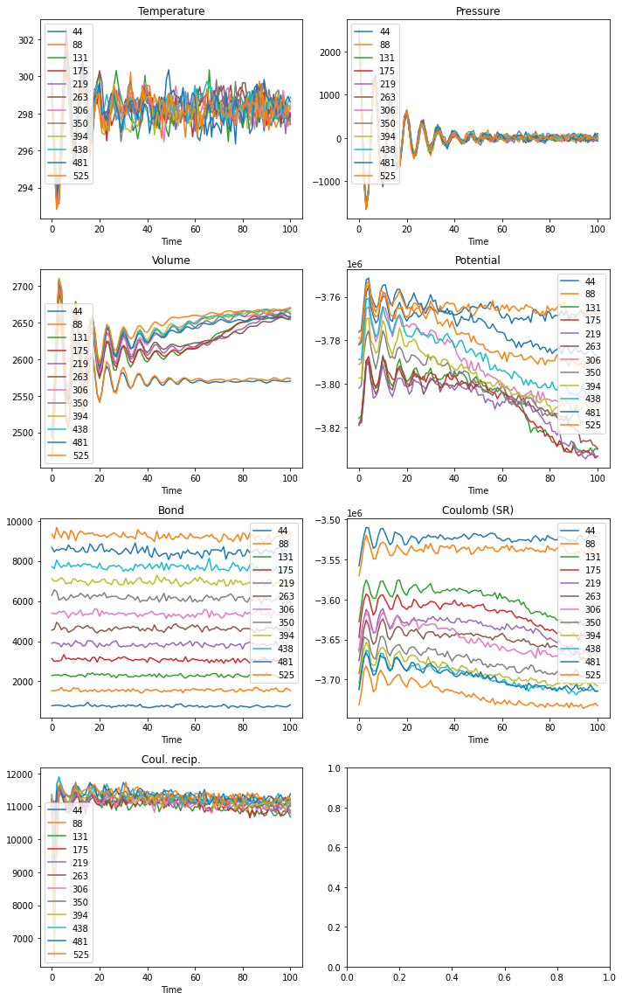

In [65]:
#n = len(res_df['nmolecules'].unique())
y_quantities = [
    'Temperature',
    'Pressure',
    'Volume',
    'Potential',
    'Bond',
    'Coulomb (SR)',
    'Coul. recip.',
    ]

n = len(y_quantities)
cols = 2
rows = round(n/cols)
if rows > 1:
    positions = [(i,j) for i in range(rows) for j in range(cols)][:n]
else:
    positions = [i for i in range(cols)][:n]
    
fig, ax = plt.subplots(rows,cols,figsize=(5*cols,4*rows))
for key, grp in res_df.groupby(['nmolecules']):
    for y_quantity, position in zip(y_quantities, positions):
        grp.plot('Time',y_quantity,ax=ax[position],label=key,title=y_quantity)
        
fig.tight_layout()

### Visualize trajectory

In [66]:
query = {
    'metadata.project': project_id,
    'metadata.step': 'ParametricBranching:GromacsNPTEquilibration:ProcessAnalyzeAndVisualize:push_filepad',
    'metadata.type': 'mp4_file',
}

In [67]:
# use underlying MongoDB functionality to check total number of documents matching query
fp.filepad.count_documents(query)

12

In [68]:
parameter_dict = {'nmolecules': 'metadata.system.surfactant.nmolecules'}

aggregation_pipeline = [
    {
        "$match": query
    },
    {
        "$sort": { 
            "metadata.datetime": pymongo.DESCENDING,
        }
    },
    { 
        "$group": { 
            "_id": { field: '${}'.format(key) for field, key in parameter_dict.items() },
            "degeneracy": {"$sum": 1}, # number matching data sets
            "latest":     {"$first": "$gfs_id"} # unique gridfs id of file
        }
    },
]

cursor = fp.filepad.aggregate(aggregation_pipeline)

obj_dict = {}
for i, c in enumerate(cursor): 
    content, metadata = fp.get_file_by_id(c["latest"])
    # print(metadata['metadata'])
    with tempfile.NamedTemporaryFile(suffix='.mp4',delete=False) as tmp:
        tmp.write(content)
        # obj_list.append(Video(filename=tmp.name)) 
        # obj_list.append(tmp.name)
        key = tuple(c["_id"].values())
        obj_dict.update({key: Video.from_file(tmp.name)})
    print('.',end='')

............

In [69]:
for key, obj in obj_dict.items():
    print(key)
    display(obj)

(175,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x1b\x1f\xbamdat\x0…

(394,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00(n\xe5mdat\x00\x00\…

(350,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00&M\x81mdat\x00\x00\…

(438,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\'\xaf\xfamdat\x00\…

(263,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00$\xdc\x9dmdat\x00\x…

(131,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x19\x94\x03mdat\x0…

(88,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x16\x0bKmdat\x00\x…

(44,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00\x10\x87emdat\x00\x…

(306,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00%%\xfbmdat\x00\x00\…

(481,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00(\x05\xe4mdat\x00\x…

(219,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00 A\x85mdat\x00\x00\…

(525,)


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x00*"Nmdat\x00\x00\x02…

### Global observables

### Visualize trajectory

In [61]:
mda_trr = mda.Universe('nvt.gro','npt.trr')

/opt/apps/mdtools/jlh-11Jul19/lib/python3.6/site-packages/MDAnalysis/topology/guessers.py:80: UserWarning: Failed to guess the mass for the following atom types: A
  warnings.warn("Failed to guess the mass for the following atom types: {}".format(atom_type))


In [62]:
# check unique resiude names in system
resnames = np.unique([ r.resname for r in mda_trr.residues ])

In [63]:
resnames

array(['AUM', 'NA', 'SDS', 'SOL'], dtype='<U3')

In [64]:
mda_view = nglview.show_mdanalysis(mda_trr)
mda_view.clear_representations()
mda_view.background = 'white'
mda_view.add_representation(repr_type='ball+stick',selection='SDS')
mda_view.add_representation(repr_type='ball+stick',selection='NA')
mda_view.add_representation(repr_type='spacefill',selection='AUM',color='yellow')
mda_view.center()

/opt/apps/mdtools/jlh-11Jul19/lib/python3.6/site-packages/MDAnalysis/coordinates/PDB.py:916: UserWarning: Found no information for attr: 'altLocs' Using default value of ' '
  "".format(attrname, default))
/opt/apps/mdtools/jlh-11Jul19/lib/python3.6/site-packages/MDAnalysis/coordinates/PDB.py:916: UserWarning: Found no information for attr: 'icodes' Using default value of ' '
  "".format(attrname, default))
/opt/apps/mdtools/jlh-11Jul19/lib/python3.6/site-packages/MDAnalysis/coordinates/PDB.py:916: UserWarning: Found no information for attr: 'occupancies' Using default value of '1.0'
  "".format(attrname, default))
/opt/apps/mdtools/jlh-11Jul19/lib/python3.6/site-packages/MDAnalysis/coordinates/PDB.py:916: UserWarning: Found no information for attr: 'tempfactors' Using default value of '0.0'
  "".format(attrname, default))


In [65]:
mda_view

NGLWidget(count=101)

In [67]:
substrate = mda_trr.select_atoms('resname AUM')

In [103]:
substrate.masses= ase.data.atomic_masses[ase.data.atomic_numbers['Au']]

In [105]:
substrtate_com_traj = np.array([substrate.center_of_mass() for ts in mda_trr.trajectory ])

In [106]:
substrtate_rgyr_traj = np.array([substrate.radius_of_gyration() for ts in mda_trr.trajectory ])

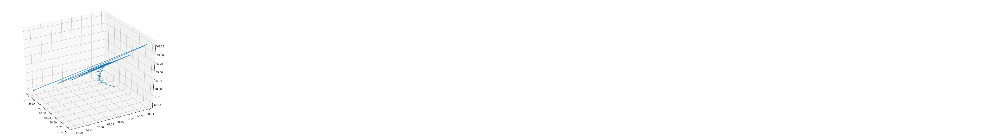

In [107]:
fig = plt.figure(figsize=(12,10))
ax = fig.add_subplot(111, projection='3d',azim=-30)
ax.plot(*substrtate_com_traj.T)
ax.scatter(*substrtate_com_traj[0,:],color='green')
ax.scatter(*substrtate_com_traj[-1,:],color='red')

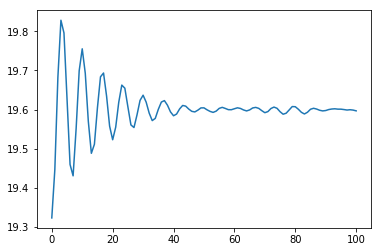

In [109]:
plt.plot(substrtate_rgyr_traj)

In [119]:
try:
    del mda_trr
except:
    pass
try:
    del mda_view
except:
    pass